<a href="https://colab.research.google.com/github/Guillaume-mcgill/school/blob/main/ESCE_415_Term_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ECSE415 Final Project: Segmentation in Medical Imaging**


Members:


*   Anthony Harissi Dagher [260924250]
*   Guillaume Rodier [260975661]
*   Jayson Zhang [260807520]
*   Mia Stevanovic [260889002]
*   William Yang [260894907]







## Install dependencies

In [ ]:
# IMPORT NUMPY
import numpy as np

# IMPORT OPEN-CV
import cv2

# GLOBAL MODULE & OS
import glob
import os
from os import listdir

# MATPLOTLIB
import matplotlib.pyplot as plt
import matplotlib.colors

# IMPORT PANDAS
import pandas as pd

# IMPORT SKLEARN DEPENDENCIES
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.cluster import DBSCAN
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.linear_model import SGDClassifier

# IMPORT SKIMAGE DEPENDENCIES
from skimage import io
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.feature import hog
from skimage import data, exposure
from skimage.draw import polygon
from skimage import feature, io
from skimage import io, filters, measure, segmentation
from skimage.feature import peak_local_max

# IMPORT RANDOM
import random

# IMPORT PILOW
from PIL import Image, ImageDraw

# IMPORT THE DEBUGGER
from IPython.core.debugger import set_trace

# IMPORT TENSORFLOW
import tensorflow as tf
from tensorflow.keras import layers, models

# IMPORT GOOGLE DRIVE
from google.colab import drive

# IMPORT MATH
import math

# IMPORT STATISTICS
import statistics

# IMPORT TQDM (PROGRESS BAR)
from tqdm import tqdm

# IMPORT PICKLE TO SAVE THE MODEL
import pickle

# TO SHOW THE PLOTS INLINE
%matplotlib inline

##CHANGE PATH VARIABLE

In [ ]:
# MOUNT DRIVE AT PATH VARIABLE FOLDER

path = "/content/drive/My Drive/UNIVERSITY/ECSE415/FINAL_PROJECT/QC/QC/"
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 3. Dataset organization

### 3.1. Sample Subject Original Image, Mask, & Overlay

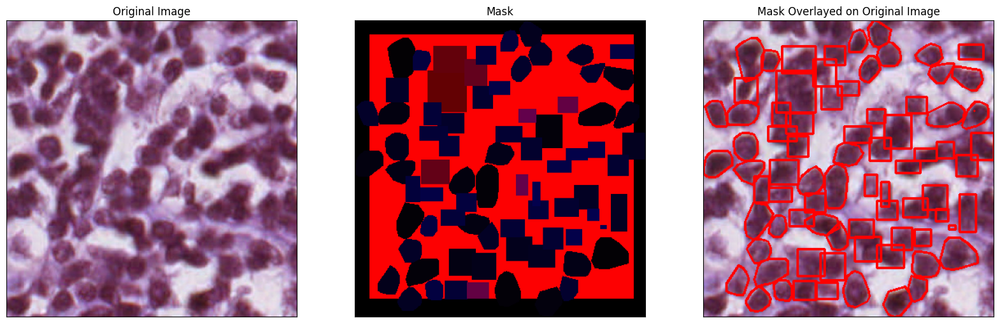

In [ ]:
# relative paths
original = cv2.imread(path + 'rgb/TCGA-A1-A0SP-DX1_id-5ea4095addda5f8398977ebc_left-7807_top-53960_bottom-54248_right-8089.png')
mask = cv2.imread(path + 'mask/TCGA-A1-A0SP-DX1_id-5ea4095addda5f8398977ebc_left-7807_top-53960_bottom-54248_right-8089.png')
csv_file = path + 'csv/TCGA-A1-A0SP-DX1_id-5ea4095addda5f8398977ebc_left-7807_top-53960_bottom-54248_right-8089.csv'

# change image to RGB
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

# get the ground truth segmentation
df = pd.read_csv(csv_file)

x_coords = df['coords_x']
y_coords = df['coords_y']

truth_img = original.copy()
for xpoints, ypoints in zip(x_coords,y_coords):
    points = []
    xpoints = xpoints.split(",")
    ypoints = ypoints.split(",")

    for x,y in zip(xpoints,ypoints):
        points.append([int(x),int(y)])

    points = np.array(points,np.int32)
    truth_img = cv2.polylines(truth_img, [points], True, (255,0,0), 2)

# display the original image
plt.figure(figsize=(20,20))
plt.subplot(131), plt.imshow(original)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

# display the mask
plt.subplot(132), plt.imshow(mask_rgb)
plt.title('Mask'), plt.xticks([]), plt.yticks([])

# display the mask over the original image
plt.subplot(133), plt.imshow(truth_img)
plt.title('Mask Overlayed on Original Image'), plt.xticks([]), plt.yticks([])
plt.show()

### 3.2. Training and Validation Splits

In [ ]:
# create a new directory
os.makedirs(path + 'splits', exist_ok=True)

# get all the file names
names = os.listdir(path + 'rgb')

# get unique patient IDs from file names
ids = list(set([f.split('_')[0] for f in names]))

# 80/20 ratio
training_ids = ids[:int(0.8 * len(ids))]
validation_ids = ids[int(0.8 * len(ids)):]

# create pandas dataframe
training = pd.DataFrame(training_ids, columns=["ID"])
validation = pd.DataFrame(validation_ids, columns=["ID"])

# Save train and validation patient ID lists
training.to_csv(os.path.join(path + 'splits', 'train_subjects.csv'), index=False)
validation.to_csv(os.path.join(path + 'splits', 'validate_subjects.csv'), index=False)

## 4. Segmentation

### 4.1. Unsupervised Segmentation (K-Means)

In [ ]:
# get all IDs for patients in "train_subjects.csv"
training = pd.read_csv(path + 'splits/' + 'train_subjects.csv')['ID']

# fetch all the images and csv files
images = []
images_and_csv = []

print('Loading training dataset ...')
print('Please wait ...')


with tf.device('/GPU:0'):

  # TRAINING DATA
  for ID in training:

    # fetch all training images in an array
    subject_images = np.array(glob.glob(path + 'rgb/' + ID + '*.png'))

    for subject_image in subject_images:
            # name of file
        filename = os.path.basename(subject_image)
            # name of file without extension
        filename = os.path.splitext(filename)[0]

            # get the csv file associated with the filename
        csv = (path + 'csv/' + filename + '.csv')

            # fetch the image and convert to RGB
        img = cv2.cvtColor(cv2.imread(subject_image), cv2.COLOR_BGR2RGB)

        images.append(img)
        images_and_csv.append((img, csv, filename))

    # get the validation data
    images_val = []
    images_and_csv_val = []

    # get all IDs for patients in "validate_subjects.csv"
    validating = pd.read_csv(path + 'splits/' + 'validate_subjects.csv')['ID']


  # VALIDATION DATA
  for ID in validating:

    # fetch all training images in an array
    subject_images_valid = np.array(glob.glob(path + 'rgb/' + ID + '*.png'))

    for subject_image in subject_images_valid:
        # name of file
        filename = os.path.basename(subject_image)
        # name of file without extension
        filename = os.path.splitext(filename)[0]

        # get the csv file associated with the filename
        csv = (path + 'csv/' + filename + '.csv')

        # fetch the image and convert to RGB
        img = cv2.cvtColor(cv2.imread(subject_image), cv2.COLOR_BGR2RGB)

        images_val.append(img)
        images_and_csv_val.append((img, csv, filename))

print('Done!')

Loading training dataset ...
Please wait ...
Done!


### 4.1.1. Optimal 'K' Value

In [ ]:
# CLUSTERING
print('Segmentation may require a lot of time to run  ...')

# basic clustering method with kmeans to retrieve cluster labels
print('Running K-Means ...')

def clustering(k, data):
    with tf.device('/GPU:0'):
        kmeans = KMeans(n_clusters=k, init='random', max_iter = 100, n_init = 10)
        kmeans.fit(data)
        labels = kmeans.labels_
        centers = kmeans.cluster_centers_
        return labels, centers

# array holds labels, centers, name, and dimensions
def segment(k, images_and_csv):
    with tf.device('/GPU:0'):
        segmented = []
        for image, csv, name in images_and_csv:
            x, y, n = image.shape
            image = image.reshape(-1,3)
            kmeans, centers = clustering(k, image)
            segmented.append((kmeans, centers, name, x, y))
        return segmented

Segmentation may require a lot of time to run  ...
Running K-Means ...


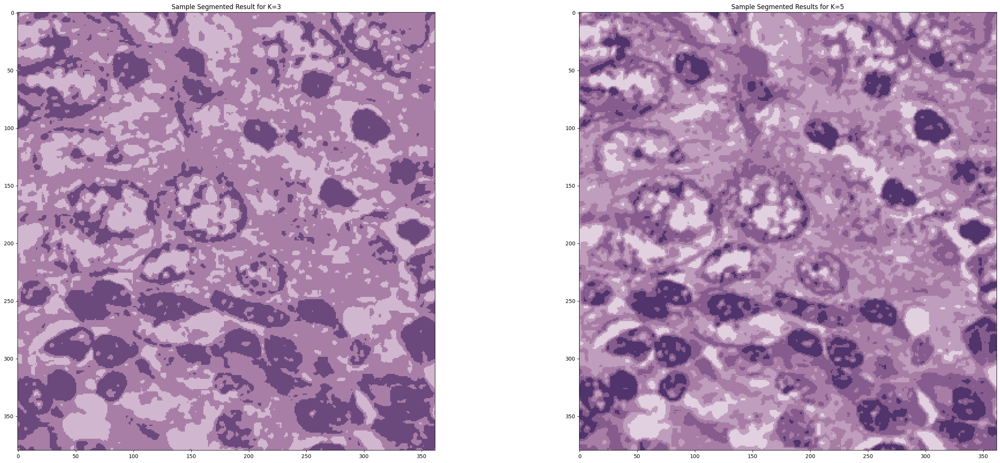

In [ ]:
with tf.device('/GPU:0'):

  # code to display results from K=3 and K=5
  segmented_images3 = segment(3, images_and_csv[:50])
  segmented_images5 = segment(5, images_and_csv[:50])

  # find sample output kmeans = 3 and 5
  # get random img id
  # img_id = random.randint(0, len(images)-1)
  img_id = random.randint(0, 49)
  img = images[img_id]

  # kmeans 3 details
  centers3 = (segmented_images3[img_id])[1]
  kmeans3 = (segmented_images3[img_id])[0]
  x3 = (segmented_images3[img_id])[3]
  y3 = (segmented_images3[img_id])[4]

  # kmeans 5 details
  centers5 = (segmented_images5[img_id])[1]
  kmeans5 = (segmented_images5[img_id])[0]
  x5 = (segmented_images5[img_id])[3]
  y5 = (segmented_images5[img_id])[4]

  # assign each pixel its corresponding cluster center
  seg_img3 = centers3[kmeans3]
  seg_img5 = centers5[kmeans5]

  # reshape back to original image shape
  seg_img3 = seg_img3.reshape(1, x3, y3, 3)
  seg_img5 = seg_img5.reshape(1, x5, y5, 3)

  # provide color
  seg_img3 = np.clip(seg_img3, 0, 255).astype(np.uint8)
  seg_img5 = np.clip(seg_img5, 0, 255).astype(np.uint8)
  seg_img3 = np.squeeze(seg_img3, axis=0)
  seg_img5 = np.squeeze(seg_img5, axis=0)

# display
plt.figure(figsize=(35,15))
plt.subplot(121)
# sample image kmeans=3
plt.title('Sample Segmented Result for K=3')
plt.imshow(seg_img3)

# sample image kmeans=5
plt.subplot(122)
plt.title('Sample Segmented Results for K=5')
plt.imshow(seg_img5)
plt.show()

In [ ]:
# function to separate the different class labels in different images
def separate_classes(segmentations, k):
    with tf.device('/GPU:0'):
        separated = []
        for labels, centers, name, x, y in segmentations:
            class_images = []
            for i in range(k):
                #create binary mask
                mask = (labels == i).reshape(x, y)
                class_image = np.zeros((x, y, 3), dtype=np.uint8)
                # assigns the pixel values if applicable cluster center
                # done separately for each color channel.
                class_image[:,:,0] = mask * centers[i,0]
                class_image[:,:,1] = mask * centers[i,1]
                class_image[:,:,2] = mask * centers[i,2]
                # get non-black pixels
                non_black = np.where(np.any(class_image != [0, 0, 0], axis=-1))
                # make non-background become white
                class_image[non_black] = [255, 255, 255]
                class_images.append(class_image)
            separated.append(class_images)
    return separated

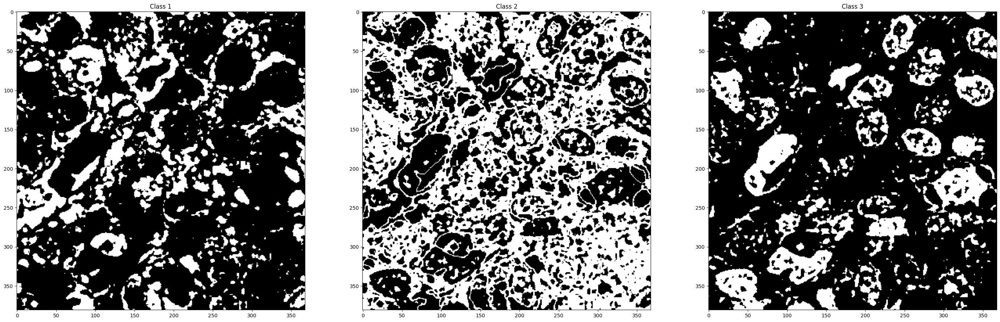

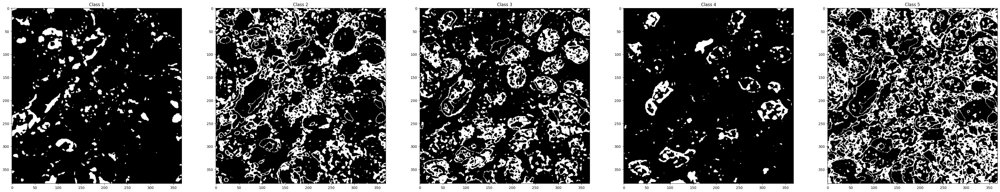

In [ ]:
# seperate classes from segmented images of k=3 and k=5
with tf.device('/GPU:0'):
    sep_kmean3 = separate_classes(segmented_images3, k=3)
    sep_kmean5 = separate_classes(segmented_images5, k=5)

    # check images
    n = 2
    class_1 = (sep_kmean3[n])[0]
    class_2 = (sep_kmean3[n])[1]
    class_3 = (sep_kmean3[n])[2]

    plt.figure(figsize=(35,35))
    plt.subplot(131), plt.title('Class 1'), plt.imshow(class_1)
    plt.subplot(132), plt.title('Class 2'), plt.imshow(class_2)
    plt.subplot(133), plt.title('Class 3'), plt.imshow(class_3)
    plt.show()

    class_1 = (sep_kmean5[n])[0]
    class_2 = (sep_kmean5[n])[1]
    class_3 = (sep_kmean5[n])[2]
    class_4 = (sep_kmean5[n])[3]
    class_5 = (sep_kmean5[n])[4]

plt.figure(figsize=(50,50))
plt.subplot(151), plt.title('Class 1'), plt.imshow(class_1)
plt.subplot(152), plt.title('Class 2'), plt.imshow(class_2)
plt.subplot(153), plt.title('Class 3'), plt.imshow(class_3)
plt.subplot(154), plt.title('Class 4'), plt.imshow(class_4)
plt.subplot(155), plt.title('Class 5'), plt.imshow(class_5)
plt.show()

In [ ]:
 # calculate the DICE coefficients

# References Varrun, Yeram (2021), Understanding DICE COEFFICIENT
# https://www.kaggle.com/code/yerramvarun/understanding-dice-coefficient

# calculate DICE
def dice(ground_truth, segment_image):
    with tf.device('/GPU:0'):
        # convert to grayscale
        truth_gray = rgb2gray(ground_truth)
        seg_gray = rgb2gray(segment_image)
        # find ideal pixel threshold to help convert grayscale images to binary
        thresh = threshold_otsu(truth_gray)
        # sets pixels > thresh to True, then converts to uint8 so it becomes binary
        truth = (truth_gray > thresh).astype(np.uint8)
        seg = (seg_gray > thresh).astype(np.uint8)
        # DICE formula
        intersection = np.sum(truth & seg)
        dice = (2. * intersection) / (np.sum(truth) + np.sum(seg))
    return dice

# ground truth function, creates a mask for all cells
def groundtruth(filename, df):
    with tf.device('/GPU:0'):
        classes = ['unlabeled','macrophage','fibroblast','lymphocyte','tumor',
        'apoptotic_body','mitotic_figure','plasma_cell','vascular_endothelium',
        'ductal_epithelium','myoepithelium','neutrophil']
        original = cv2.imread(path + 'rgb/' + filename + '.png')
        truths = []
        for c in classes:
            if c in df['raw_classification'].unique():
                # get the ground truth segmentation
                truth = np.zeros(original.shape)
                # get only rows for this type
                filtered = df[df['raw_classification'] == c]
                x_coords = filtered['coords_x']
                y_coords = filtered['coords_y']
                # fill the cells
                for xpoints, ypoints in zip(x_coords,y_coords):
                    points = []
                    xpoints = xpoints.split(",")
                    ypoints = ypoints.split(",")
                    for x,y in zip(xpoints,ypoints):
                        points.append([int(x),int(y)])
                    points = np.array(points,np.int32)
                    truth = cv2.fillPoly(truth, [points], (255,255,255))
                # store final result and the class
                truths.append((truth, c))
    return truths

In [ ]:
# function to find test different K values on segmented images
def optimalk(data):
    with tf.device('/GPU:0'):
        # for k from 1 to 8
        for i in range(8):
            print('\nDICE coefficient for various cells using K=' + str(i+1)+ ':')
            # apply clustering
            segmentations = segment(i+1, data)
            # seperate classes for all images
            classes = separate_classes(segmentations, i+1)
            total_dice = {}
            cell_count = {}
            for j in range(len(segmentations)):
                _, _, name, _, _ = segmentations[j]
                index = None
                # get the appropriate csv name
                for l, (img, csv, filename) in enumerate(images_and_csv):
                    if filename == name:
                        index = l
                        break
                # get the ground truth
                df = pd.read_csv((images_and_csv[index])[1])
                # get all groundtruths for all cells
                truths = groundtruth(name, df)
                # for every cell type ground truth
                for truth, celltype in truths:
                    maxvalue = 0
                    for group in classes[index]:
                        # get the highest dice from this image's segments
                        value = dice(truth, group)
                        if value > maxvalue:
                            maxvalue = value
                    # add this value to the total dice value for this cell type
                    # count number of times an image has this cell (for the average calculation)
                    if celltype in total_dice:
                        total_dice[celltype] += maxvalue
                        cell_count[celltype] += 1
                    else:
                        total_dice[celltype] = maxvalue
                        cell_count[celltype] = 1

            # for every result
            for cell in total_dice:
                # find the average dice
                average = total_dice[cell]/cell_count[cell]
                print('      The average DICE coefficient for cell type ' + cell + ' is '+ str(average))

In [ ]:
# call function on our images
optimalk(images_and_csv[:50])


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.05799123771910174
      The average DICE coefficient for cell type fibroblast is 0.2028795706981442
      The average DICE coefficient for cell type lymphocyte is 0.1286682463305949
      The average DICE coefficient for cell type plasma_cell is 0.04293596171790775
      The average DICE coefficient for cell type tumor is 0.2724372346423925
      The average DICE coefficient for cell type vascular_endothelium is 0.0824406223816304
      The average DICE coefficient for cell type ductal_epithelium is 0.17455353584124744
      The average DICE coefficient for cell type apoptotic_body is 0.02023387638616164
      The average DICE coefficient for cell type mitotic_figure is 0.016614709196900734
      The average DICE coefficient for cell type macrophage is 0.15479747894183357

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unlabeled 

### 4.1.2. DICE Coefficients Explained - Optimized Value is K = 3

To find the optimized value of K, we decided to compute the individual DICE coefficient values for all cell types in the segmented training images for a given value of K, and use those values to find the average DICE coefficient for different cells for that K. Of course, the calculation of the DICE coefficient was not performed on the entire segmented image, but on the seperated segments in their resepective classes. Each seperated segment's DICE coefficient was calculated, and we preserved the highest coefficient from this selection (as, in theory, that specific segment should best represent the cells). This way, the background of the cell pictures was not involved in the evaluation for ideal K. This process was repeated for a range of K values, hence giving us an average DICE coefficient for cells per K for a range of K values. By doing so, we were able to get an understanding of how accurate the segmented classes (following a certain K value's clustering) were in comparison to their ground truth binary masks. The next step was evidently to select the K with an average DICE coefficient closest to 1, as this implied the majority of segmented cells were closest to their ground truth, and therefore majoritarily detectable through that K value's clustering. However, we had to take into account that some cells benefited from higher K values, while others did not, and therefore find the perfect balance. It's important to note that we also ensured that our binary ground truth images were composed of either black or white colors (black implying background, and white implying cells), as per the csv files. This is also how we preprocessed our seperated image segments.

As seen above, our vary for many of the cells. Specifically for tumors, it forms a sort of bell curve, which peaks at K=3 and begins decreasing in value afterwards. This evidently implies that at K=3, the segmented cell image is the closest to the ground truth image. However, the other cells types, though very insignificant when it came to the DICE coefficient results, seem to gradually increase as the K increases as well, but very slightly. Despite this, we believe K=3 is the ideal result, as it provided, on average, the best results for all cells. Even if the less prominent cell types are slightly less accurate than at higher K's for example, the downfall is minimal when considering how much it improves the more important cells. Anything above K=3 becomes a clear problem for fibroblast and tumor cells, losing a lot of accuracy. So, K=3 is our ideal K.

### 4.1.3. Original Image, Segmented Image with Optimized 'K', & Ground Truth

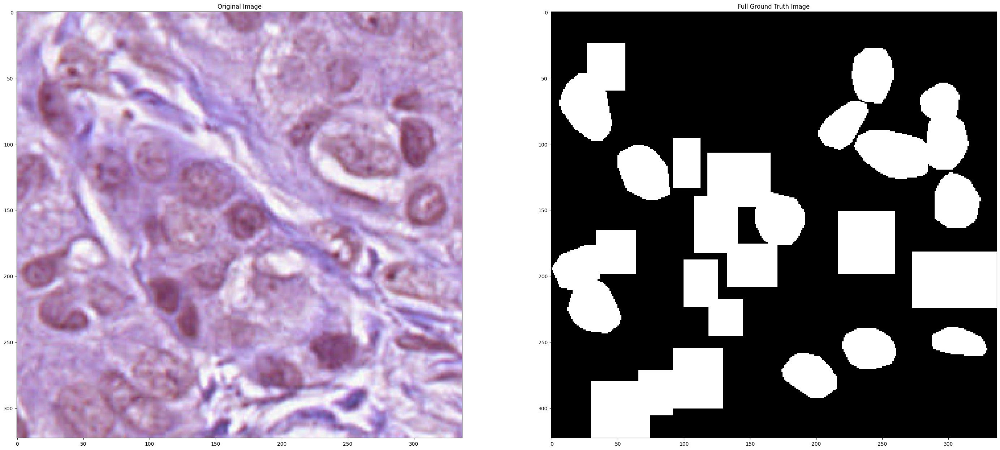

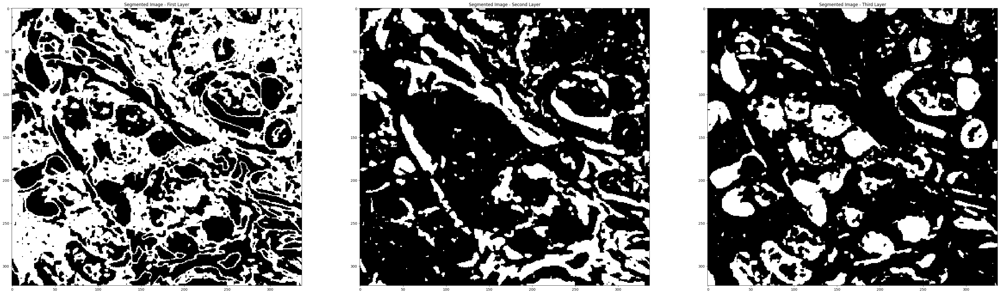

In [ ]:
# retrieve complete groundtruth (basically a masK)
def fullgroundtruth(filename, df):
    with tf.device('/GPU:0'):
        original = cv2.imread(path + 'rgb/' + filename + '.png')
        # get the ground truth segmentation
        truth = np.zeros(original.shape)
        # get only rows for this type
        x_coords = df['coords_x']
        y_coords = df['coords_y']
        # fill the cells
        for xpoints, ypoints in zip(x_coords,y_coords):
            points = []
            xpoints = xpoints.split(",")
            ypoints = ypoints.split(",")
            for x,y in zip(xpoints,ypoints):
                points.append([int(x),int(y)])
            points = np.array(points,np.int32)
            truth = cv2.fillPoly(truth, [points], (255,255,255))
    return truth

# get original image and ground truth
n = 1
df = pd.read_csv((images_and_csv[n])[1])
filename = (images_and_csv[n])[2]
original = cv2.imread(path + 'rgb/' + filename + '.png')
truthimage = fullgroundtruth(filename, df)

# segmentations with optimal k=3
segmented = segment(3, images_and_csv[:50])
classes = separate_classes(segmented, 3)
segment1 = (classes[n])[0]
segment2 = (classes[n])[1]
segment3 = (classes[n])[2]

# Output the original image
plt.figure(figsize=(35,35))
plt.subplot(121),plt.title('Original Image'), plt.imshow(original)
plt.subplot(122), plt.title('Full Ground Truth Image'), plt.imshow(truthimage)
plt.show()
plt.figure(figsize=(50,50))
plt.subplot(131), plt.title('Segmented Image - First Layer'), plt.imshow(segment1)
plt.subplot(132), plt.title('Segmented Image - Second Layer'), plt.imshow(segment2)
plt.subplot(133), plt.title('Segmented Image - Third Layer'), plt.imshow(segment3)
plt.show()

### 4.1.4. Grayscale Segmentation Results

In [ ]:
# defining new arrays for grayscale images
grayscale = []
grayscale_and_csv = []

with tf.device('/GPU:0'):

    for ID in training:

      # fetch all training images in an array
      subject_images = np.array(glob.glob(path + 'rgb/' + ID + '*.png'))

      for subject_image in subject_images:
              # name of file
          filename = os.path.basename(subject_image)
              # name of file without extension
          filename = os.path.splitext(filename)[0]

              # get the csv file associated with the filename
          csv = (path + 'csv/' + filename + '.csv')

              # fetch the image and convert to a 3-channel grayscale image
          imggray = cv2.cvtColor(cv2.imread(subject_image), cv2.COLOR_BGR2GRAY)
              # converting from grayscale to color keeps the grayscale values, but adds the missing third channel
          imggray = cv2.cvtColor(imggray, cv2.COLOR_GRAY2RGB)

          grayscale.append(imggray)
          grayscale_and_csv.append((imggray, csv, filename))

graysegment = segment(3, grayscale_and_csv[:50])

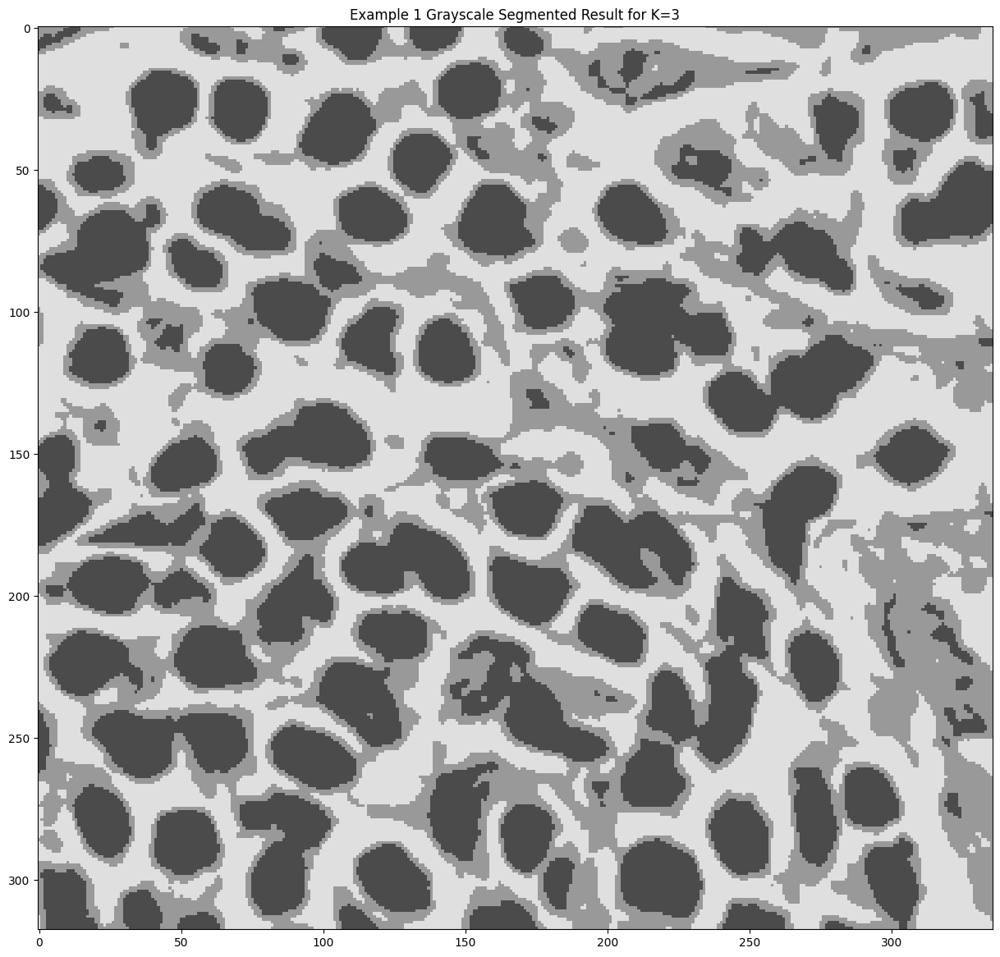

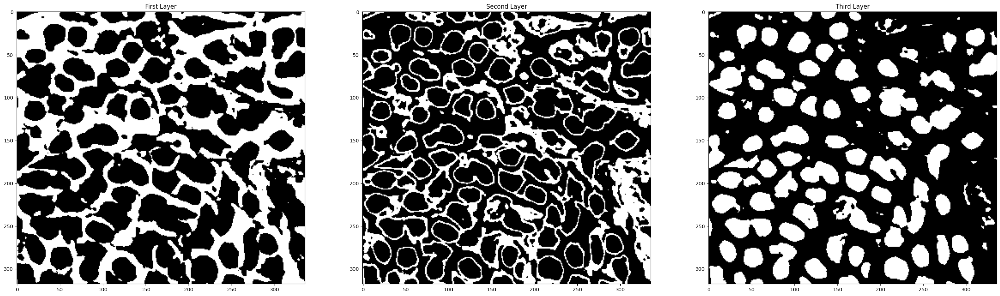

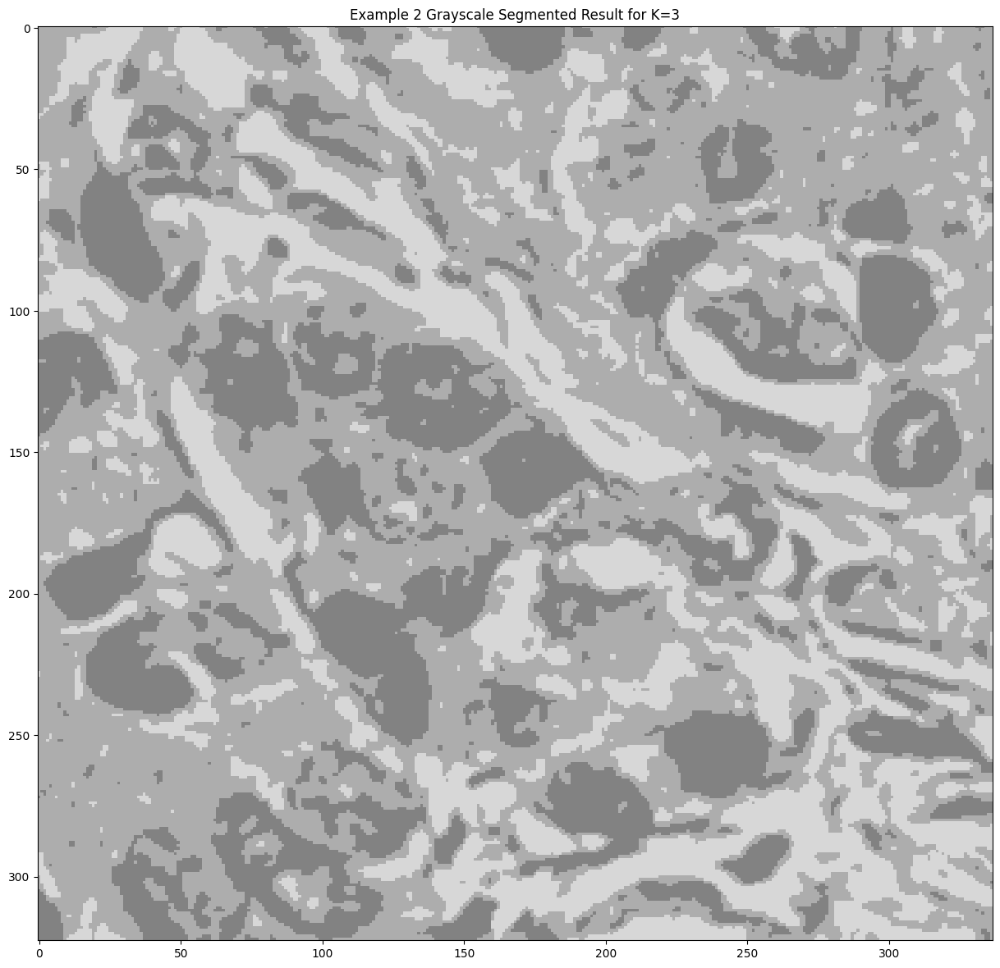

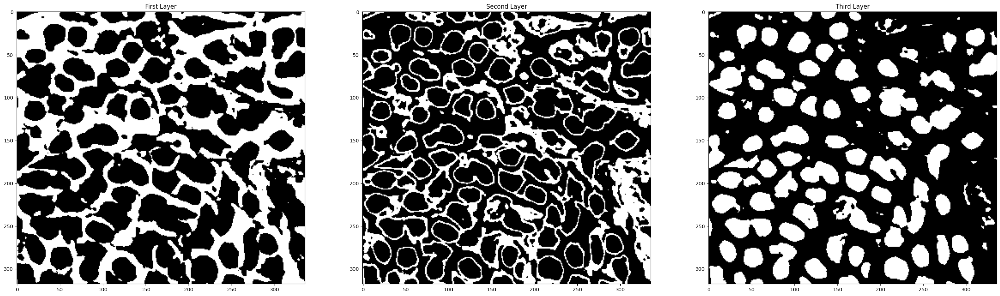

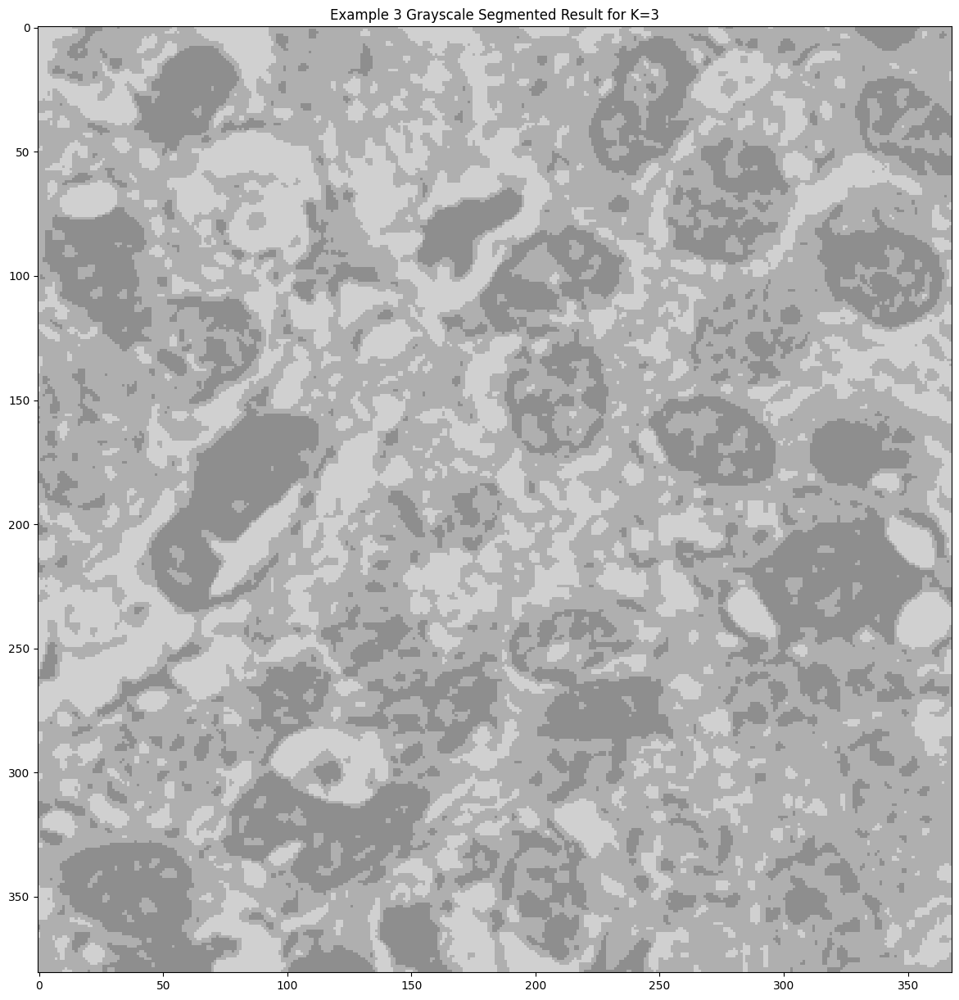

...

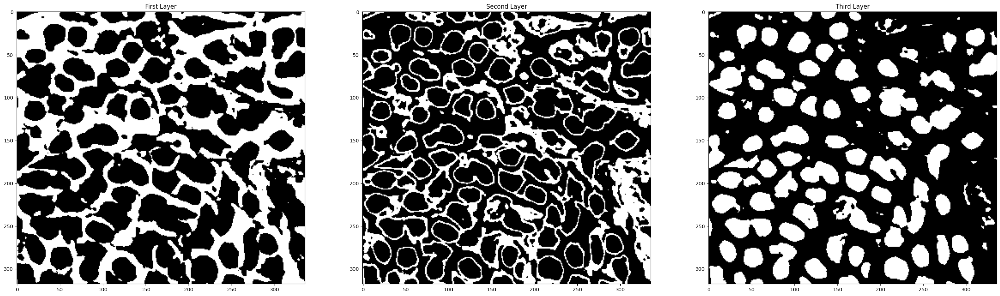

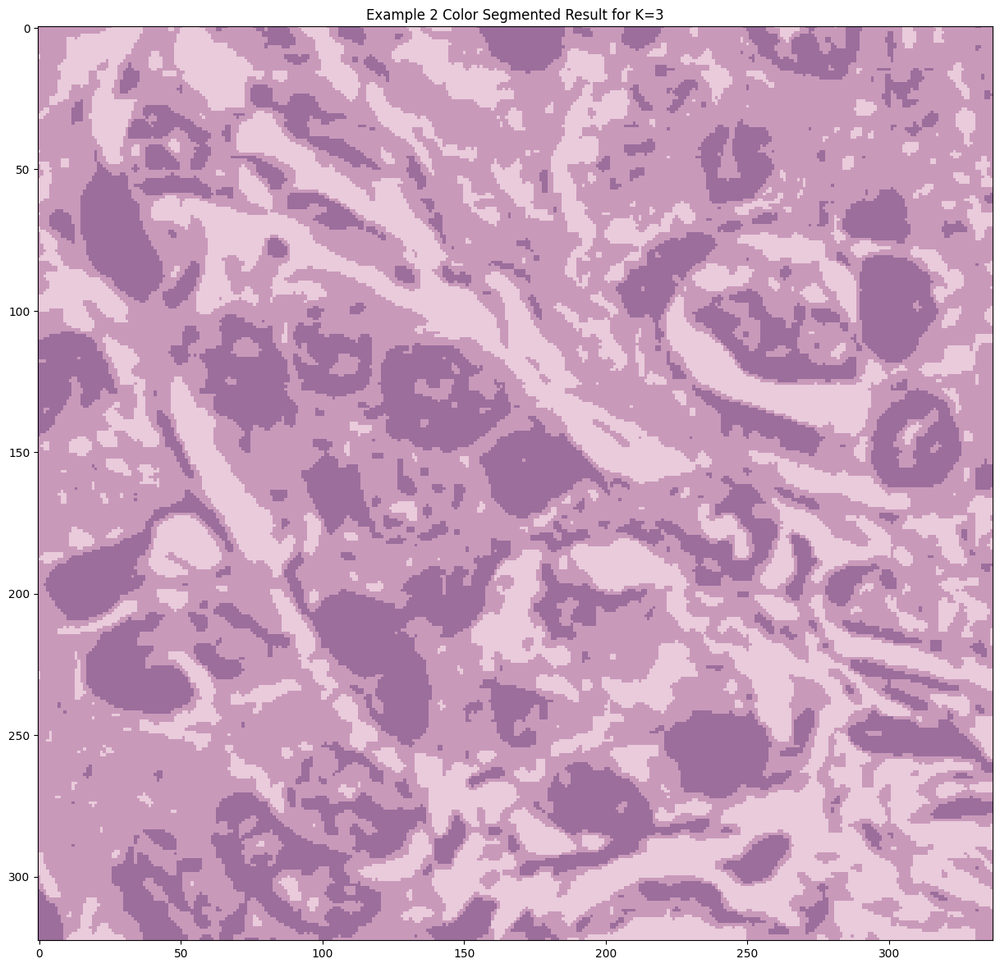

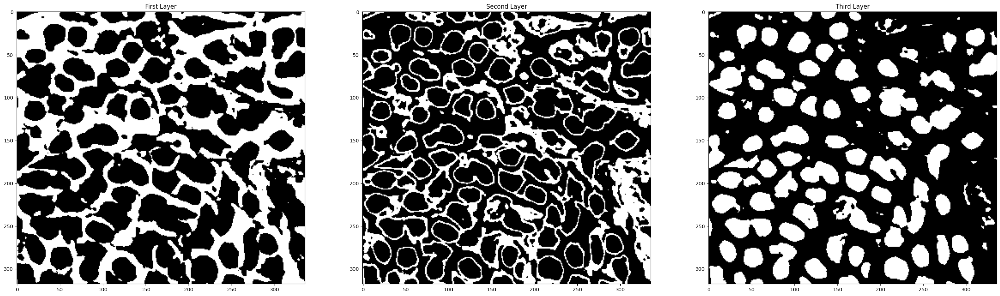

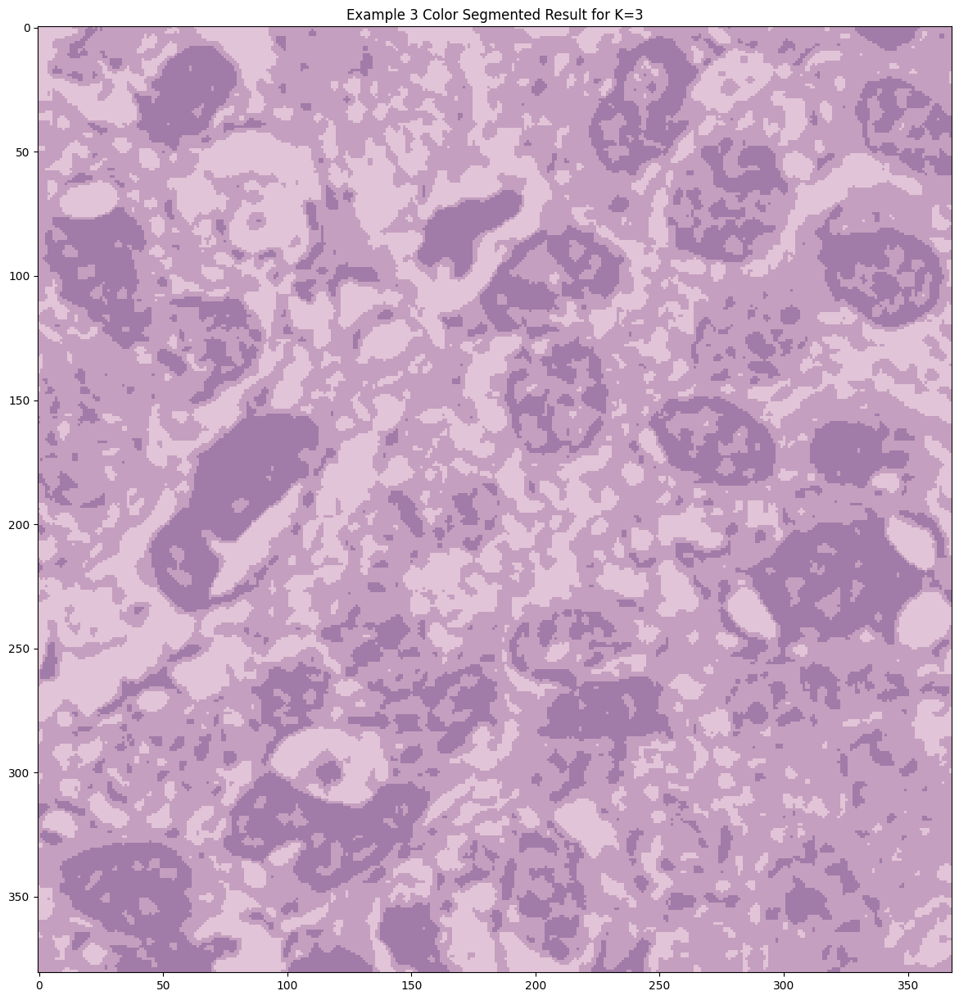

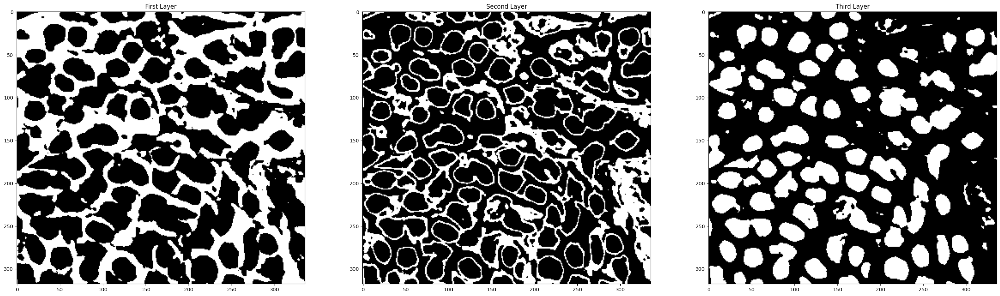

In [ ]:
with tf.device('/GPU:0'):

    # fetching 3 examples in grayscale
    for img_id in range(3):

        # kmeans 3 details
        centers3 = (graysegment[img_id])[1]
        kmeans3 = (graysegment[img_id])[0]
        x3 = (graysegment[img_id])[3]
        y3 = (graysegment[img_id])[4]

        # assign each pixel its corresponding cluster center
        seg_img3 = centers3[kmeans3]

        # reshape back to original image shape
        seg_img3 = seg_img3.reshape(1, x3, y3, 3)

        # provide color
        seg_img3 = np.clip(seg_img3, 0, 255).astype(np.uint8)
        seg_img3 = np.squeeze(seg_img3, axis=0)

        # display
        plt.figure(figsize=(15,15))
        # sample image kmeans=3
        plt.title('Example {} Grayscale Segmented Result for K=3' .format(img_id + 1))
        plt.imshow(seg_img3)

        classes = separate_classes(graysegment, 3)
        n = 0
        segment1 = (classes[n])[0]
        segment2 = (classes[n])[1]
        segment3 = (classes[n])[2]

        plt.figure(figsize=(35,35))
        plt.subplot(131), plt.title('First Layer'), plt.imshow(segment1)
        plt.subplot(132), plt.title('Second Layer'), plt.imshow(segment2)
        plt.subplot(133), plt.title('Third Layer'), plt.imshow(segment3)
        plt.show()

        # fetching 3 examples in color

    for img_id in range(3):

        segmented_images3 = segment(3, images_and_csv[:50])
        # kmeans 3 details
        centers3 = (segmented_images3[img_id])[1]
        kmeans3 = (segmented_images3[img_id])[0]
        x3 = (segmented_images3[img_id])[3]
        y3 = (segmented_images3[img_id])[4]

        # assign each pixel its corresponding cluster center
        seg_img3 = centers3[kmeans3]

        # reshape back to original image shape
        seg_img3 = seg_img3.reshape(1, x3, y3, 3)

        # provide color
        seg_img3 = np.clip(seg_img3, 0, 255).astype(np.uint8)
        seg_img3 = np.squeeze(seg_img3, axis=0)

        # display
        plt.figure(figsize=(15,15))
        # sample image kmeans=3
        plt.title('Example {} Color Segmented Result for K=3' .format(img_id + 1))
        plt.imshow(seg_img3)

        classes = separate_classes(graysegment, 3)
        n = 0
        segment1 = (classes[n])[0]
        segment2 = (classes[n])[1]
        segment3 = (classes[n])[2]

        plt.figure(figsize=(35,35))
        plt.subplot(131), plt.title('First Layer'), plt.imshow(segment1)
        plt.subplot(132), plt.title('Second Layer'), plt.imshow(segment2)
        plt.subplot(133), plt.title('Third Layer'), plt.imshow(segment3)
        plt.show()

In [ ]:
# DICE for the first sample in color

c1 = []
c1_and_csv = []
with tf.device('/GPU:0'):

  img, csv, filename = images_and_csv[0]

  # fetch the image and convert to RGB
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  c1.append(img)
  c1_and_csv.append((img, csv, filename))

optimalk(c1_and_csv)


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.030197444831591175
      The average DICE coefficient for cell type fibroblast is 0.04658305605323778
      The average DICE coefficient for cell type lymphocyte is 0.3813852026904199
      The average DICE coefficient for cell type plasma_cell is 0.13817979055219642

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unlabeled is 0.04950370649579093
      The average DICE coefficient for cell type fibroblast is 0.05996218970902515
      The average DICE coefficient for cell type lymphocyte is 0.5402850249677383
      The average DICE coefficient for cell type plasma_cell is 0.22606668393590645

DICE coefficient for various cells using K=3:
      The average DICE coefficient for cell type unlabeled is 0.056166200088404304
      The average DICE coefficient for cell type fibroblast is 0.10715444755863697
      The average DICE coeffic

In [ ]:
# DICE for the first sample in grayscale

g1 = []
g1_and_csv = []
with tf.device('/GPU:0'):

  img, csv, filename = images_and_csv[0]

  # fetch the image and convert to RGB
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

  g1.append(img)
  g1_and_csv.append((img, csv, filename))

optimalk(g1_and_csv)


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.030197444831591175
      The average DICE coefficient for cell type fibroblast is 0.04658305605323778
      The average DICE coefficient for cell type lymphocyte is 0.3813852026904199
      The average DICE coefficient for cell type plasma_cell is 0.13817979055219642

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unlabeled is 0.0487873717315485
      The average DICE coefficient for cell type fibroblast is 0.06378556015283195
      The average DICE coefficient for cell type lymphocyte is 0.5270915081828249
      The average DICE coefficient for cell type plasma_cell is 0.21919670811342695

DICE coefficient for various cells using K=3:
      The average DICE coefficient for cell type unlabeled is 0.055355737889176124
      The average DICE coefficient for cell type fibroblast is 0.10035019231873242
      The average DICE coeffici

In [ ]:
# DICE for the second sample in color

c2 = []
c2_and_csv = []
with tf.device('/GPU:0'):

    for image,csv,filename in images_and_csv[:15]:

      # fetch the image and convert to RGB
      img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      c2.append(img)
      c2_and_csv.append((img, csv, filename))

optimalk(c2_and_csv)


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.060814311057835684
      The average DICE coefficient for cell type fibroblast is 0.08144967896002435
      The average DICE coefficient for cell type lymphocyte is 0.18176817728937872
      The average DICE coefficient for cell type plasma_cell is 0.05844821230099756
      The average DICE coefficient for cell type tumor is 0.2861867551532076
      The average DICE coefficient for cell type vascular_endothelium is 0.035328971343283326
      The average DICE coefficient for cell type ductal_epithelium is 0.17455353584124744
      The average DICE coefficient for cell type apoptotic_body is 0.027913267507649872
      The average DICE coefficient for cell type mitotic_figure is 0.023121387283236993
      The average DICE coefficient for cell type macrophage is 0.013951955224583425

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unl

In [ ]:
# DICE for the second sample in grayscale

g2 = []
g2_and_csv = []
with tf.device('/GPU:0'):

    for image,csv,filename in images_and_csv[:15]:

      # fetch the image and convert to RGB
      img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
      img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

      g2.append(img)
      g2_and_csv.append((img, csv, filename))

optimalk(g2_and_csv)


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.060814311057835684
      The average DICE coefficient for cell type fibroblast is 0.08144967896002435
      The average DICE coefficient for cell type lymphocyte is 0.18176817728937872
      The average DICE coefficient for cell type plasma_cell is 0.05844821230099756
      The average DICE coefficient for cell type tumor is 0.2861867551532076
      The average DICE coefficient for cell type vascular_endothelium is 0.035328971343283326
      The average DICE coefficient for cell type ductal_epithelium is 0.17455353584124744
      The average DICE coefficient for cell type apoptotic_body is 0.027913267507649872
      The average DICE coefficient for cell type mitotic_figure is 0.023121387283236993
      The average DICE coefficient for cell type macrophage is 0.013951955224583425

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unl

In [ ]:
# DICE for third sample in color

c3 = []
c3_and_csv = []
with tf.device('/GPU:0'):

    for image,csv,filename in images_and_csv[:30]:

      # fetch the image and convert to RGB
      img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      c3.append(img)
      c3_and_csv.append((img, csv, filename))

optimalk(c3_and_csv)


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.06315182536943781
      The average DICE coefficient for cell type fibroblast is 0.1475701373879
      The average DICE coefficient for cell type lymphocyte is 0.15489355776476504
      The average DICE coefficient for cell type plasma_cell is 0.05258776538089921
      The average DICE coefficient for cell type tumor is 0.29466307041322193
      The average DICE coefficient for cell type vascular_endothelium is 0.05388641300812354
      The average DICE coefficient for cell type ductal_epithelium is 0.17455353584124744
      The average DICE coefficient for cell type apoptotic_body is 0.02023387638616164
      The average DICE coefficient for cell type mitotic_figure is 0.013967328556806807
      The average DICE coefficient for cell type macrophage is 0.07586667672080084

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unlabeled 

In [ ]:
# DICE for the third sample in grayscale

g3 = []
g3_and_csv = []
with tf.device('/GPU:0'):

  for image,csv,filename in images_and_csv[:30]:

    # fetch the image and convert to RGB
    img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    g3.append(img)
    g3_and_csv.append((img, csv, filename))

optimalk(g3_and_csv)


DICE coefficient for various cells using K=1:
      The average DICE coefficient for cell type unlabeled is 0.06315182536943781
      The average DICE coefficient for cell type fibroblast is 0.1475701373879
      The average DICE coefficient for cell type lymphocyte is 0.15489355776476504
      The average DICE coefficient for cell type plasma_cell is 0.05258776538089921
      The average DICE coefficient for cell type tumor is 0.29466307041322193
      The average DICE coefficient for cell type vascular_endothelium is 0.05388641300812354
      The average DICE coefficient for cell type ductal_epithelium is 0.17455353584124744
      The average DICE coefficient for cell type apoptotic_body is 0.02023387638616164
      The average DICE coefficient for cell type mitotic_figure is 0.013967328556806807
      The average DICE coefficient for cell type macrophage is 0.07586667672080084

DICE coefficient for various cells using K=2:
      The average DICE coefficient for cell type unlabeled 

Previously, we've determined that the optimal value of K was 3. Thus, we will begin to compare the DICE coefficients for K = 3. For the first set of colored and grayscale samples, we notice that the DICE coefficient is extremely similar. In most cases, the DICE coefficients were actually lower for the grayscale sample when compared to its colored counterpart. However, the grayscale's DICE coefficient for the tumor cell type was slightly higher. Moving on to the second set of samples, we notice that the DICE coefficients are once again very similar. In this regard, the DICE coefficient for the unlabeled, tumor and macrophage cell types were higher for the grayscale image. Finally, for the last set of samples, the DICE coefficient were once more similar between the colored and grayscale samples. The DICE coefficient for the unlabeled, fibroblast, tumor, and macrophage were higher for the grayscale sample. In conclusion, it seems that changing our images to grayscale may improve the DICE coefficient for certain cell types, albeit at the detriment of others. Both the improvement and drawbacks seem marginal.

### 4.1.5. Comparison of DBSCAN Segmentation with Optimized KMeans

Segmentation may require a lot of time to run  ...
Running DBSCAN Clustering ...


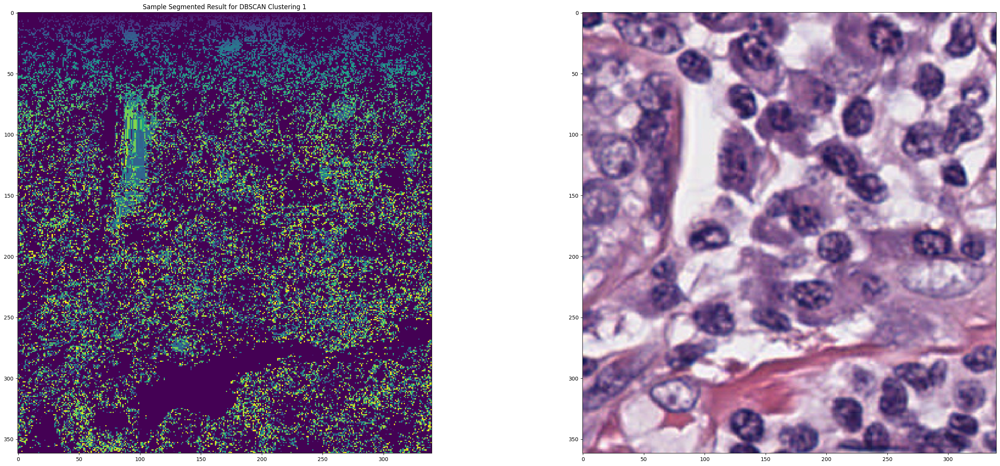

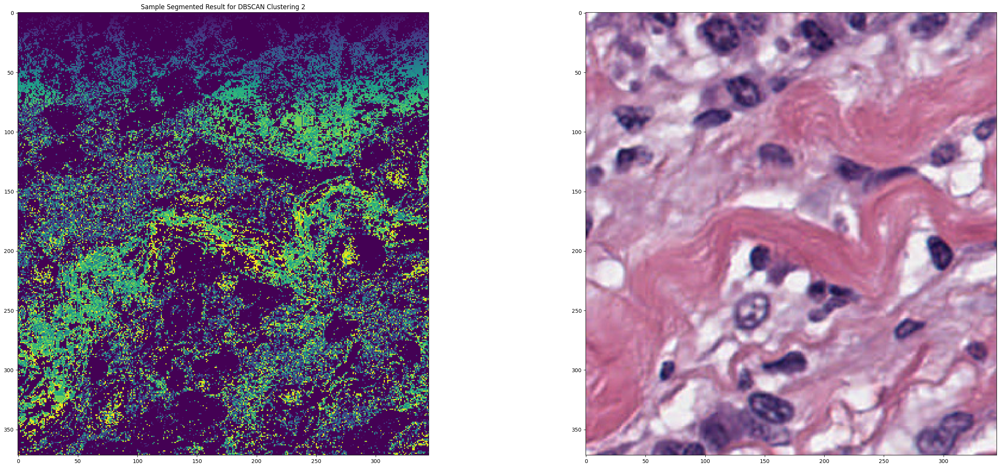

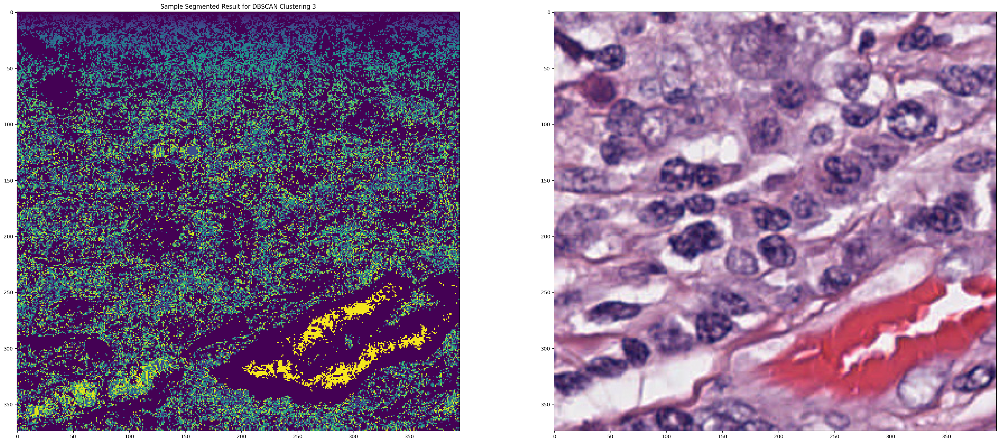

In [ ]:
# DBSCAN CLUSTERING

print('Segmentation may require a lot of time to run  ...')

# basic clustering method with DBSCAN to retrieve cluster labels
print('Running DBSCAN Clustering ...')

def dbscan_clustering(data, eps, min_samples):
  with tf.device('/GPU:0'):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(data)
    return labels

# array holds labels, centers, name, and dimensions
def dbscan_segment(eps, min_samples, images_and_csv):
  segmented = []
  with tf.device('/GPU:0'):
    for image, csv, name in images_and_csv:
        x, y, n = image.shape
        image = image.reshape(-1,3)
        labels = dbscan_clustering(image, eps, min_samples)
        segmented_image = labels.reshape(x, y)
        segmented.append((segmented_image, name, x, y))
  return segmented

with tf.device('/GPU:0'):
    dbscan_segmented = dbscan_segment(eps=0.01, min_samples=5, images_and_csv=images_and_csv[:3])

# display
plt.figure(figsize=(35,15))
plt.subplot(121)
plt.title('Sample Segmented Result for DBSCAN Clustering 1')
plt.imshow(dbscan_segmented[0][0])
plt.subplot(122)
plt.imshow(images_and_csv[0][0])

plt.figure(figsize=(35,15))
plt.subplot(121)
plt.title('Sample Segmented Result for DBSCAN Clustering 2')
plt.imshow(dbscan_segmented[1][0])
plt.subplot(122)
plt.imshow(images_and_csv[1][0])

plt.figure(figsize=(35,15))
plt.subplot(121)
plt.title('Sample Segmented Result for DBSCAN Clustering 3')
plt.imshow(dbscan_segmented[2][0])
plt.subplot(122)
plt.imshow(images_and_csv[2][0])

DISCUSSION

For the second unsupervised segmentation method, DBSCAN segmentation was chosen to be compared to the KMeans results. DBSCAN is a density based clustering algorithm, which relies on separating regions of high density using regions of lower density to form the clusters. The algorithm uses two primary inputs: min_samples, representing the minimum number of points within a
given radius, and eps, representing the radius. To find the clusters using the algorithm, values of 0.01 and 5 were used for eps and min_samples, respectively. This resulted in the segmentations depicted in above, demonstrating that the algorithm was best able to perform clustering in the lighter regions of the image. Although the results are not accurate as KMeans, as can be seen comparatively from above, the method can be used to detect regions of similar brightness levels which would correspond to similar densities. However, the segmentation method is not as accurate for individual cell detection.


*   source: Hari Krishna Kanagala and V.V. Jaya Rama Krishnaiah. A comparative study of k-means,
dbscan and optics. In 2016 International Conference on Computer Communication and Infor-
matics (ICCCI), pages 1–6, 2016.



# 4.2. Supervised Segmentation

### 4.2.1. Description of Stochastic gradient descent SVM used

The supervised approach that we are using is a Support Vector Machine (SVM) for performing segmentation of nuclei in medical images. The goal is to classify each pixel in the image as belonging to a specific class (cell/not cell) based on the labeled training data. To train the SVM, the input RGB images are converted to grayscale and then the features in each pixel are extracted. The features in our case refer to the mean value of a 3x3 window scanned on the resized images (of shape 100x100). Next, the labeled training data are used to train the SVM classifier using the extracted features as inputs and the class labels as outputs. We are making use of a stochastic gradient descent algorithm in the process to enable shorter parameter updates of our model, and therefore, faster training. The SVM is trained to find the hyperplane that maximally separates the different classes in the feature space, so that it can classify new pixels based on their feature values. Once the SVM is trained, it can be used to classify each pixel in the test images as belonging to a specific class. The resulting segmentation map can be visualized as a grayscale image where each pixel represents the predicted class label.

SOURCES:


*   Course notes
*   https://www.nature.com/articles/nbt1206-1565





### RESIZE THE IMAGES AND GET THE MASKS FOR THE TRUE LABELS

In [ ]:
def convert_X_Y(images_and_csv):

    # convert data such that it can be used by machine learning algorithms
    X = []
    Y = []

    with tf.device('/GPU:0'):
      for image,csv,_ in tqdm(images_and_csv):

          # convert image to grayscale
          gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
          x = cv2.resize(gray,(100,100))
          X.append(x)

          # read csv file and image
          data = pd.read_csv(csv)

          # get point coordinates and labels
          x_coords = data['coords_x']
          y_coords = data['coords_y']
          pixel_labels = data['raw_classification']

          # mask for the different types of cells
          mask = np.zeros(gray.shape)

          # get the list of points
          for xpoints,ypoints,label in zip(x_coords,y_coords,pixel_labels):

              points = []

              # coordinates
              xpoints = xpoints.split(",")
              ypoints = ypoints.split(",")

              for x,y in zip(xpoints,ypoints):
                points.append([int(x),int(y)])
              points = np.array(points, np.int32)

              # fill the mask cell regions
              mask = cv2.fillPoly(mask, [points], 255)
          mask = cv2.resize(mask,(100,100))
          mask[mask>0] = 255

          Y.append(mask)
    return np.array(X),np.array(Y)

## Convert images to X,Y format

In [ ]:
# get the training data
X_train,Y_train = convert_X_Y(images_and_csv)

In [ ]:
# get the validation data
X_val,Y_val= convert_X_Y(images_and_csv_val)

In [ ]:
# Save the array to a binary file
# np.save(path+"X_train.npy", X_train)
X_train = np.load(path+"X_train.npy",allow_pickle=True)

# np.save(path+"Y_train.npy", Y_train)
Y_train = np.load(path+"Y_train.npy",allow_pickle=True)

# np.save(path+"X_val.npy", X_val)
X_val = np.load(path+"X_val.npy",allow_pickle=True)

# np.save(path+"Y_val.npy", Y_val)
Y_val = np.load(path+"Y_val.npy",allow_pickle=True)

### ensure data works by plotting it

(<Axes: >, <matplotlib.image.AxesImage at 0x7fbcb59f3bb0>)

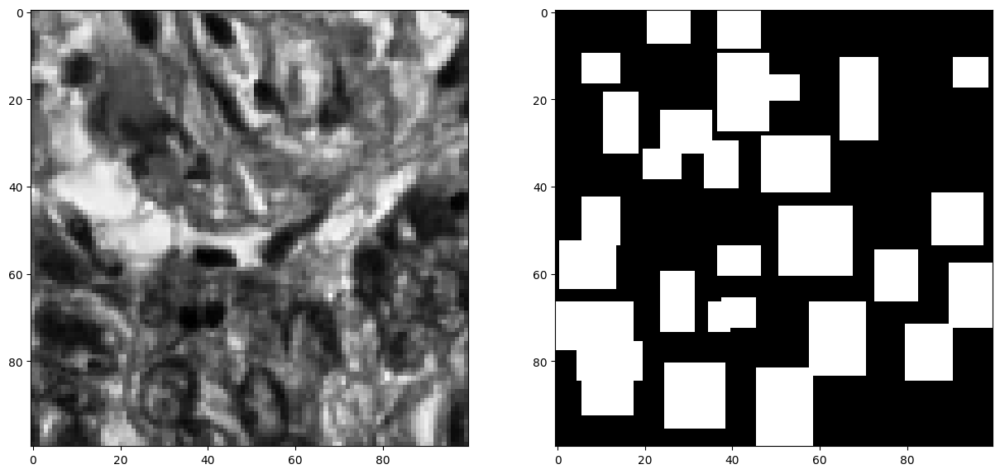

In [ ]:
# ensure training set is okay
plt.figure(figsize=(15,15)),
plt.subplot(121),plt.imshow(X_train[1],cmap='gray')
plt.subplot(122),plt.imshow(Y_train[1],cmap='gray')

(<Axes: >, <matplotlib.image.AxesImage at 0x7fbcb5924d30>)

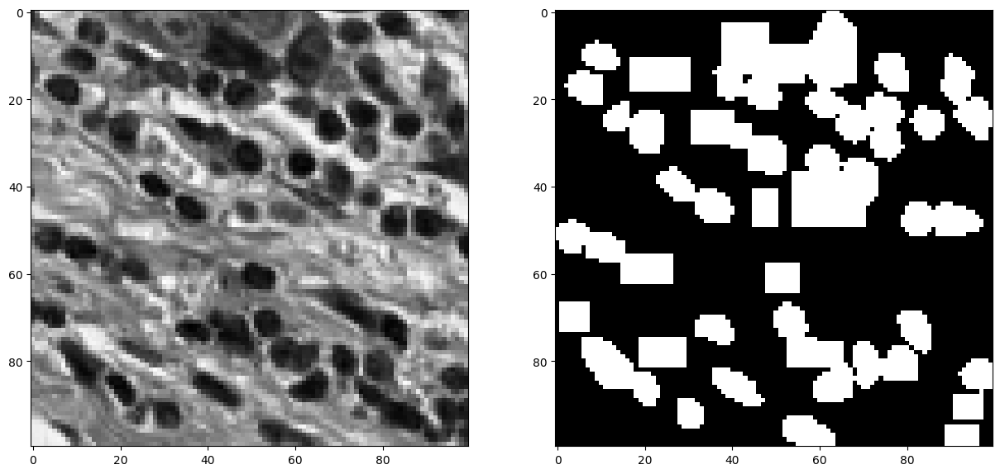

In [ ]:
# ensure validation set is okay
plt.figure(figsize=(15,15))
plt.subplot(121),plt.imshow(X_val[11],cmap='gray')
plt.subplot(122),plt.imshow(Y_val[11],cmap='gray')

### Scanning window function (feature extraction)

In [ ]:
def get_features(images,labels, w):
  with tf.device('/GPU:0'):
    # array of features
    X = []
    Y = []

    # loop through all the images
    for i in tqdm(range(len(images))):
      image = images[i]
      label = labels[i]

      # get the side dimension
      side = w//2

      # scan through the image with a window
      for y in range(side,image.shape[0]-side+1,2):
        for x in range(side,image.shape[1]-side+1,2):

          # get appropriate labels
          Y.append(label[y,x])

          # get the window of pixels
          window = image[y-side:y+side+1,x-side:x+side+1]

          # get the features in the window
          X.append(sum(window.ravel())/(w*w))

    return np.array(X),np.array(Y)

In [ ]:
# get the training features
train_X,train_Y = get_features(X_train,Y_train,3)

# get the validation features
valid_X,valid_Y = get_features(X_val,Y_val,3)

100%|██████████| 299/299 [00:15<00:00, 19.48it/s]


### save the features

In [ ]:
# Save the array to a binary file
np.save(path+"train_X.npy", train_X)
np.save(path+"train_Y.npy", train_Y)

# Load the saved array from the binary file
# train_X = np.load(path+"train_X.npy",allow_pickle=True)
# train_Y = np.load(path+"train_Y.npy",allow_pickle=True)

# Save the array to a binary file
np.save(path+"valid_X.npy", valid_X)
np.save(path+"valid_y.npy", valid_Y)

# Load the saved array from the binary file
# valid_X = np.load(path+"valid_X.npy",allow_pickle=True)
# valid_Y = np.load(path+"valid_Y.npy",allow_pickle=True)

### Train the stochastic gradient descent classifier

In [ ]:
# initialize model with desired parameters
segmentor = SGDClassifier(loss='hinge', alpha=0.001, max_iter = 100000, tol=1e-4)
with tf.device('/GPU:0'):
  # fit the model
  segmentor.fit(train_X.reshape(-1,1).astype(int), train_Y)

In [ ]:
## TO SAVE THE MODEL ##
filename='SDG_segmentation_model.pkl'
pickle.dump(segmentor, open(path+filename,'wb'))


## TO RELOAD THE SAVED MODEL ##
# segmentor = pickle.load(open(path+filename, 'rb'))

## 4.2.2 Performance on the training images

In [ ]:
# predict the data
X_train_preds = segmentor.predict(train_X.reshape(-1,1).astype(int))

# accuracy on training set
accuracy_train = np.sum(X_train_preds == train_Y)/(train_Y.shape[0])*100
print("the accuracy on the training set is: {0} %".format(accuracy_train))

the accuracy on the training set is: 72.7521937716263 %


## 4.2.3 Performance on the validation images

In [ ]:
# validation set predictions
X_val_preds = segmentor.predict(valid_X.reshape(-1,1).astype(int))

# accuracy
accuracy_val = np.sum(X_val_preds == valid_Y)/(valid_Y.shape[0])*100
print("the accuracy on the validation set is: {0} %".format(accuracy_val))

the accuracy on the validation set is: 73.12775919732442 %


## 4.2.4 Supervised vs unsupervised

<ipython-input-58-25a77a1033c3>:31: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  peaks1 = measure.label(peak_local_max(distance1, indices=False, footprint=np.ones((3, 3))), background=1)
<ipython-input-58-25a77a1033c3>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  peaks2 = measure.label(peak_local_max(distance2, indices=False, footprint=np.ones((3, 3))), background=1)
<ipython-input-58-25a77a1033c3>:41: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  peaks3 = measure.label(peak_local_max(distance3, indices=False

(<Axes: title={'center': 'image 3 original image'}>,
 Text(0.5, 1.0, 'image 3 original image'))

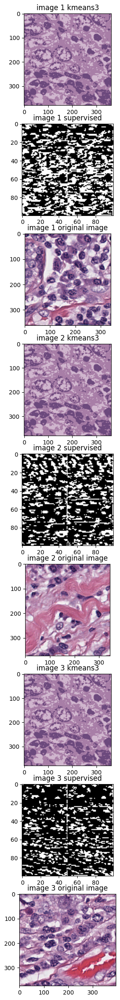

In [ ]:
# show the first 3 image
img1 = X_val_preds[0:100*100].reshape((100,100))
img2 = X_val_preds[100*100:2*100*100].reshape((100,100))
img3 = X_val_preds[2*100*100:3*100*100].reshape((100,100))

kmeans_images = []
for i in range(3):
  img_id = img_id
  img_kmeans0 = images[i]

  # kmeans 3 details
  centers3 = (segmented_images3[img_id])[1]
  kmeans3 = (segmented_images3[img_id])[0]
  x3 = (segmented_images3[img_id])[3]
  y3 = (segmented_images3[img_id])[4]

  # assign each pixel its corresponding cluster center
  seg_img3 = centers3[kmeans3]

  # reshape back to original image shape
  seg_img3 = seg_img3.reshape(1, x3, y3, 3)

  # provide color
  seg_img3 = np.clip(seg_img3, 0, 255).astype(np.uint8)
  seg_img3 = np.squeeze(seg_img3, axis=0)
  kmeans_images.append(seg_img3)


# Apply watershed segmentation to image 1
distance1 = filters.sobel(img1)
peaks1 = measure.label(peak_local_max(distance1, indices=False, footprint=np.ones((3, 3))), background=1)
labels1 = segmentation.watershed(-distance1, peaks1, mask=img1)

# Apply watershed to image 2
distance2 = filters.sobel(img2)
peaks2 = measure.label(peak_local_max(distance2, indices=False, footprint=np.ones((3, 3))), background=1)
labels2 = segmentation.watershed(-distance2, peaks2, mask=img2)

# Apply watershed to image 3
distance3 = filters.sobel(img3)
peaks3 = measure.label(peak_local_max(distance3, indices=False, footprint=np.ones((3, 3))), background=1)
labels3 = segmentation.watershed(-distance3, peaks3, mask=img3)


# SUPERVISED LEARNING
plt.figure(figsize=(30,30))
plt.subplot(911),plt.imshow(kmeans_images[0],cmap='gray'),plt.title("image 1 kmeans3")
plt.subplot(912),plt.imshow(labels1, cmap='gray'),plt.title("image 1 supervised")
plt.subplot(913),plt.imshow(images[0],cmap='gray'), plt.title("image 1 original image")

plt.subplot(914),plt.imshow(kmeans_images[1],cmap='gray'),plt.title("image 2 kmeans3")
plt.subplot(915),plt.imshow(labels2, cmap='gray'),plt.title("image 2 supervised")
plt.subplot(916),plt.imshow(images[1],cmap='gray'), plt.title("image 2 original image")

plt.subplot(917),plt.imshow(kmeans_images[2],cmap='gray'),plt.title("image 3 kmeans3")
plt.subplot(918),plt.imshow(labels3, cmap='gray'),plt.title("image 3 supervised")
plt.subplot(919),plt.imshow(images[2],cmap='gray'), plt.title("image 3 original image")

In [ ]:
def dice_grayscale(ground_truth, segment_image):
    with tf.device('/GPU:0'):
        # find ideal pixel threshold to help convert grayscale images to binary
        thresh = threshold_otsu(ground_truth)
        # sets pixels > thresh to True, then converts to uint8 so it becomes binary
        truth = (ground_truth > thresh).astype(np.uint8)
        seg = (segment_image > thresh).astype(np.uint8)
        # DICE formula
        intersection = np.sum(truth & seg)
        dice = (2. * intersection) / (np.sum(truth) + np.sum(seg))
    return dice

In [ ]:
# calculate dice of the first three images

dice1 = dice_grayscale(X_val[0],img1)
dice2 = dice_grayscale(X_val[1],img2)
dice3 = dice_grayscale(X_val[2],img3)

# convert kmeans images to grayscale & reshape to 100X100
kmeans_images[0] = cv2.cvtColor(kmeans_images[0], cv2.COLOR_RGB2GRAY)
kmeans_images[0] = cv2.resize(kmeans_images[0],(100,100))
kmeans_images[1] = cv2.cvtColor(kmeans_images[1], cv2.COLOR_RGB2GRAY)
kmeans_images[1] = cv2.resize(kmeans_images[1],(100,100))
kmeans_images[2] = cv2.cvtColor(kmeans_images[2], cv2.COLOR_RGB2GRAY)
kmeans_images[2] = cv2.resize(kmeans_images[2],(100,100))

dice4 = dice_grayscale(X_val[0],kmeans_images[0])
dice5 = dice_grayscale(X_val[1],kmeans_images[1])
dice6 = dice_grayscale(X_val[2],kmeans_images[2])

# print dice coefficients for supervised learning
print("dice coefficient for supervised segmentation of image 1: ",dice1)
print("dice coefficient for supervised segmentation of image 2: ",dice2)
print("dice coefficient for supervised segmentation of image 3: ",dice3)

# now print dice coefficients for kmeans3 images
print("dice coefficient for unsupervised segmentation of image 1: ",dice4)
print("dice coefficient for unsupervised segmentation of image 2: ",dice5)
print("dice coefficient for unsupervised segmentation of image 3: ",dice6)

dice coefficient for supervised segmentation of image 1:  0.36815000660240327
dice coefficient for supervised segmentation of image 2:  0.3008849557522124
dice coefficient for supervised segmentation of image 3:  0.24238943136128663
dice coefficient for unsupervised segmentation of image 1:  0.46940878853180923
dice coefficient for unsupervised segmentation of image 2:  0.4253106038717134
dice coefficient for unsupervised segmentation of image 3:  0.4054889833784306


DISCUSSION:

Upon comparing the supervised and unsupervised segmentation techniques on the validation images, we observe that the unsupervised method offers more defined cell segmentation. The unsupervised method also yields higher dice coefficients, with a difference of at least 0.1 for all images in comparison to the supervised method. Based on our implementation, the unsupervised method exhibits better performance, albeit this could be attributed to the parameter tuning of our model. Although our model yielded better classification accuracy with different parameters, we were unable to retrieve the ideal parameters as the model failed to save. Thus, the performance improvement is potentially a result of our model's parameter tuning, rather than the feature extraction method and algorithm itself. In conclusion, the unsupervised segmentation method performs better in terms of both qualitative and quantitative metrics for the selected validation images.

## 4.2.5 What nuclei can be segmented easily

In [ ]:
# GET THE IMAGES OF A SINGLE SUBJECT

# Create dataset
single_subject_images = []
single_subject_images_and_csv = []

subject_image_files = np.array(glob.glob(path + 'rgb/' + 'TCGA-OL-A66P-DX1' + '*.png'))
with tf.device('/GPU:0'):

    for subject_image in subject_image_files:
        # name of file
        filename = os.path.basename(subject_image)

        # name of file without extension
        filename = os.path.splitext(filename)[0]

        # get the csv file associated with the filename
        csv = (path + 'csv/' + filename + '.csv')

        # fetch the image and convert to RGB
        img = cv2.cvtColor(cv2.imread(subject_image), cv2.COLOR_BGR2RGB)
        single_subject_images.append(img)
        single_subject_images_and_csv.append((img, csv, filename))

In [ ]:
# flatten subject data and pass it to classifier

flatten_data = []
for image in single_subject_images:
  grayscale_img = cv2.resize(image, (100,100))
  grayscale_img = cv2.cvtColor(grayscale_img, cv2.COLOR_RGB2GRAY)
  for pixel in grayscale_img.flatten():
    flatten_data.append(pixel)
flatten_data = np.array(flatten_data)

# make segmentor predict for a single subject
single_subject_predictions = segmentor.predict(flatten_data.reshape(-1,1).astype(int))

In [ ]:
# analyze what class best fits those predictions
def analyze_predictions(predictions):

  # create percentages for each class
  percentages = {}

  # reshape the data
  predictions = predictions.reshape((-1,100,100))
  i=0

  # circle through each image
  for image,csv,_ in single_subject_images_and_csv:

      # get current image
      current = predictions[i]

      # read csv file and image
      df = pd.read_csv(csv)

      # create a dictionary with the different classes
      labels = df['raw_classification']

      for index, row in df.iterrows():

        # get the cell coordinates from the current row
        x_coords = row['coords_x']
        y_coords = row['coords_y']
        classification = row['raw_classification']

        cell_mask = np.zeros(image.shape[:2])

        # fill the current cell in the mask
        points = []
        xpoints = x_coords.split(",")
        ypoints = y_coords.split(",")
        for x, y in zip(xpoints, ypoints):
            points.append([int(x), int(y)])
        points = np.array(points, np.int32)

        cell_mask = cv2.fillPoly(cell_mask, [points], 255)
        cell_mask = cv2.resize(cell_mask,(100,100))
        cell_mask[cell_mask>0] = 255
        features = current[cell_mask.astype(bool)]

        # calculate pixel-wise agreement
        agreement = np.sum(features == cell_mask[cell_mask.astype(bool)])/(len(features))*100

        if classification in percentages:
          percentages[classification].append(agreement)
        else:
          percentages[classification] = [agreement]

      # increment the image
      i+=1

  # for each class, calculate the percentage and output it
  for key in percentages:
    percent = sum(percentages[key])/len(percentages[key])
    print("the percent match for the cell type {0} is : {1}".format(key,percent))

# call the function
analyze_predictions(single_subject_predictions)

the percent match for the cell type unlabeled is : 21.24845880669334
the percent match for the cell type plasma_cell is : 57.75255378205361
the percent match for the cell type fibroblast is : 27.615022979230638
the percent match for the cell type lymphocyte is : 59.96548175847257
the percent match for the cell type macrophage is : 39.71811217455143
the percent match for the cell type tumor is : 37.6067014624964
the percent match for the cell type vascular_endothelium is : 35.199999999999996
the percent match for the cell type apoptotic_body is : 62.0
the percent match for the cell type mitotic_figure is : 36.828644501278774


(<Axes: title={'center': 'mask for the apoptotic_body cells'}>,
 Text(0.5, 1.0, 'mask for the apoptotic_body cells'))

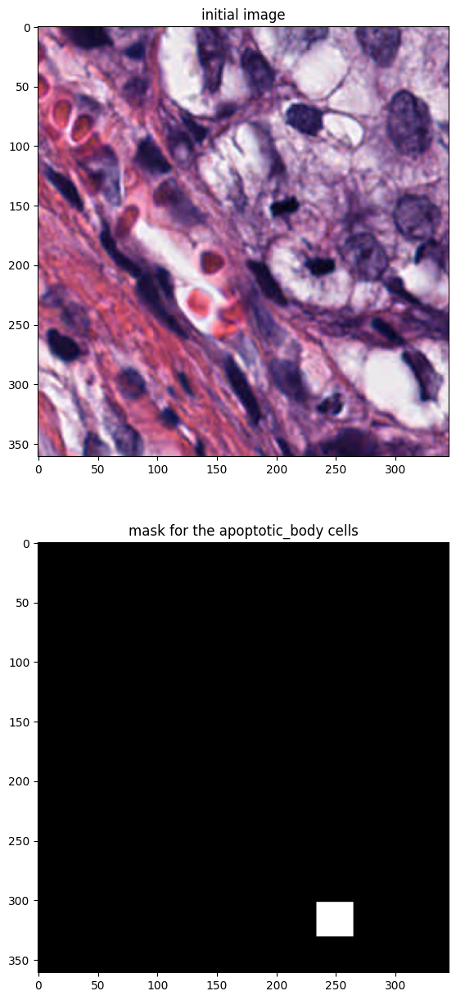

In [ ]:
# make a mask with a single class for the first image
cell_type = 'apoptotic_body'

image,csv,filename = images_and_csv[112]

# read csv file and image
df = pd.read_csv(csv)

labels = df['raw_classification']

cell_mask = np.zeros(image.shape[:2])
for index, row in df.iterrows():

  # get the cell coordinates from the current row
  x_coords = row['coords_x']
  y_coords = row['coords_y']
  classification = row['raw_classification']

  # fill the current cell in the mask
  points = []
  xpoints = x_coords.split(",")
  ypoints = y_coords.split(",")
  for x, y in zip(xpoints, ypoints):
      points.append([int(x), int(y)])
  points = np.array(points, np.int32)

  if (classification == cell_type):
    cell_mask = cv2.fillPoly(cell_mask, [points], 255)

plt.figure(figsize=(15,15))
plt.subplot(211), plt.imshow(image), plt.title("initial image")
plt.subplot(212), plt.imshow(cell_mask,cmap='gray'), plt.title("mask for the {0} cells".format(cell_type))

In [ ]:
# create a dictionnary to count the number of each class
numbers = {}

for image, csv, filename in tqdm(images_and_csv):

  # read csv file and image
  df = pd.read_csv(csv)
  labels = df['raw_classification']

  for index, row in df.iterrows():

    classification = row['raw_classification']

    if classification in numbers:
      numbers[classification] +=1
    else:
      numbers[classification] = 1

print(numbers)

100%|██████████| 1468/1468 [01:06<00:00, 22.15it/s]

{'plasma_cell': 4984, 'fibroblast': 7049, 'ductal_epithelium': 480, 'lymphocyte': 11220, 'tumor': 16762, 'unlabeled': 5926, 'apoptotic_body': 347, 'macrophage': 1138, 'vascular_endothelium': 429, 'mitotic_figure': 193, 'myoepithelium': 51, 'eosinophil': 3, 'neutrophil': 45}


DISCUSSION:

A comparison was conducted between the cell areas in the original resized images and the corresponding predictions. The pixel-wise percentage of matches was computed by analyzing all the images in the dataset. The results indicate that the highest percentage matches were obtained for the apoptotic_body (62.0%), lymphocyte (59.96548175847257%), and plasma_cell (57.75255378205361%) classes. However, upon inspecting the sample visualization of the apoptotic_body class, it is unclear why this particular class exhibits a higher percentage match, as the segmentation output does not appear to be more well-defined than the other classes.

## 4.2.6 Why are those nuclei better segmented

DISCUSSION:

To investigate the reason for the higher percentage match in the aforementioned cell types, we conducted an analysis of the class instances in each image. We observed that the classes with the highest percentage match did not necessarily have the highest number of training examples. This suggests that the superior performance is likely attributed to the fact that our algorithm fails to accurately capture the relevant features in the images, resulting in erroneous predictions. As a result, further improvement of our supervised algorithm is required to enhance its performance on the dataset. Only then would the higher percentage matches hold significant value in our analysis.

# 5. Detecting and Counting Tumors

## 5.1. Preparing the Data

In [ ]:
# get all IDs for patients in "train_subjects.csv"
training = pd.read_csv(path + 'splits/' + 'train_subjects.csv')['ID']

# fetch all the images and csv files
images = []
masks  = []
images_and_csv_gray = []
csv_for_prepared = []
with tf.device('/GPU:0'):

    for ID in training:
        # fetch all training images in an array
        subject_images = np.array(glob.glob(path + 'rgb/' + ID + '*.png'))

        # REMEMBER TO MAKE NESTED BEFORE SUBMISSION, PLACE IT UNNESTED for now TO SPEED UP THE PROCESS
        for subject_image in subject_images:
                # name of file
            filename = os.path.basename(subject_image)
                # name of file without extension
            filename = os.path.splitext(filename)[0]

                # get the csv file associated with the filename
            csv  = (path + 'csv/'  + filename + '.csv')
            mask = (path + 'mask/' + filename + '.png')

                # fetch the image and convert to RGB
            img = cv2.cvtColor(cv2.imread(subject_image), cv2.COLOR_BGR2GRAY)
            msk = cv2.cvtColor(cv2.imread(mask), cv2.COLOR_BGR2GRAY)

            images.append(img)
            masks.append(msk)
            images_and_csv_gray.append((img, csv, filename))
            csv_for_prepared.append(csv)

    # get the validation data
    images_val = []
    images_and_csv_gray_val = []
    masks_val = []
    csv_for_prepared_val = []

    # get all IDs for patients in "validate_subjects.csv"
    validating = pd.read_csv(path + 'splits/' + 'validate_subjects.csv')['ID']

    for ID in validating:

        # fetch all training images in an array
        subject_images_valid = np.array(glob.glob(path + 'rgb/' + ID + '*.png'))

        # REMEMBER TO MAKE NESTED BEFORE SUBMISSION, PLACE IT UNNESTED for now TO SPEED UP THE PROCESS
        for subject_image in subject_images_valid:
                # name of file
            filename = os.path.basename(subject_image)
                # name of file without extension
            filename = os.path.splitext(filename)[0]

                # get the csv file associated with the filename
            csv  = (path + 'csv/'  + filename + '.csv')
            mask = (path + 'mask/' + filename + '.png')

                # fetch the image and convert to RGB
            img = cv2.cvtColor(cv2.imread(subject_image), cv2.COLOR_BGR2GRAY)
            msk = cv2.cvtColor(cv2.imread(mask), cv2.COLOR_BGR2GRAY)

            images_val.append(img)
            masks_val.append(msk)
            images_and_csv_gray_val.append((img, csv, filename))
            csv_for_prepared_val.append(csv)

    print('Done!')

Done!


In [ ]:
data_prepared = []
data_prepared_val = []

data_prep_and_csv = []
data_prep_and_csv_val = []
with tf.device('/GPU:0'):

    for i in range(len(masks)):

        test1 = masks[i]
        _, test1 = cv2.threshold(test1, 0, 255, cv2.THRESH_BINARY)

        test2 = images[i]

        testA = csv_for_prepared[i]

    # algorithm to slice images and masks

        if test1.shape[0] > test2.shape[0]:
            test1 = test1[0:test2.shape[0], 0:test1.shape[1]]
        else:
            test2 = test2[0:test1.shape[0], 0:test2.shape[1]]

        if test1.shape[1] > test2.shape[1]:
            test1 = test1[0:test1.shape[0], 0:test2.shape[1]]

        else:
            test2 = test2[0:test2.shape[0], 0:test1.shape[1]]

        test = np.bitwise_and(test1, test2)
        _, temp = cv2.threshold(masks[i], 10, 255, cv2.THRESH_BINARY_INV)

        if temp.shape[0] > test2.shape[0]:
            temp = temp[0:test2.shape[0], 0:temp.shape[1]]
        else:
            test2 = test2[0:temp.shape[0], 0:test2.shape[1]]

        if temp.shape[1] > test2.shape[1]:
            temp = temp[0:temp.shape[0], 0:test2.shape[1]]

        else:
            test2 = test2[0:test2.shape[0], 0:temp.shape[1]]

        ran = np.bitwise_and(temp, test)
        data_prepared.append(ran)
        data_prep_and_csv.append((ran, testA))

    for i in range(len(masks_val)):

        test1 = masks_val[i]
        _, test1 = cv2.threshold(test1, 0, 255, cv2.THRESH_BINARY)

        test2 = images_val[i]

        testA = csv_for_prepared_val[i]

    # algorithm to slice images and masks

        if test1.shape[0] > test2.shape[0]:
            test1 = test1[0:test2.shape[0], 0:test1.shape[1]]
        else:
            test2 = test2[0:test1.shape[0], 0:test2.shape[1]]

        if test1.shape[1] > test2.shape[1]:
            test1 = test1[0:test1.shape[0], 0:test2.shape[1]]

        else:
            test2 = test2[0:test2.shape[0], 0:test1.shape[1]]

        test = np.bitwise_and(test1, test2)
        _, temp = cv2.threshold(masks_val[i], 10, 255, cv2.THRESH_BINARY_INV)

        if temp.shape[0] > test2.shape[0]:
            temp = temp[0:test2.shape[0], 0:temp.shape[1]]
        else:
            test2 = test2[0:temp.shape[0], 0:test2.shape[1]]

        if temp.shape[1] > test2.shape[1]:
            temp = temp[0:temp.shape[0], 0:test2.shape[1]]

        else:
            test2 = test2[0:test2.shape[0], 0:temp.shape[1]]

        ran = np.bitwise_and(temp, test)
        data_prepared_val.append(ran)
        data_prep_and_csv_val.append((ran, testA))

In [ ]:
# USE HOG TO SELECT FEATURES

def HoG(img_array):
    X = []
    Y = []
    with tf.device('/GPU:0'):
        # loop through all the images and get the HoG descriptors
        for i, (image, name) in tqdm(enumerate(img_array)):
            # get the csv for this image
            df = pd.read_csv(name)
            # calculate HoG features for that image
            with tf.device('/GPU:0'):
                hog_features, visual = hog(image, orientations=8, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

            with tf.device('/GPU:0'):
                # for each cell in the image
                for index, row in df.iterrows():
                    # get the cell coordinates from the current row
                    x_coords = row['coords_x']
                    y_coords = row['coords_y']
                    classification = row['raw_classification']
                    # create a new empty mask for the current cell
                    cell_mask = np.zeros(image.shape)
                    # fill the current cell in the mask
                    points = []
                    xpoints = x_coords.split(",")
                    ypoints = y_coords.split(",")
                    for x, y in zip(xpoints, ypoints):
                        points.append([int(x), int(y)])
                    points = np.array(points, np.int32)
                    cell_mask = cv2.fillPoly(cell_mask, [points], 255)

                    # extract only the hog feature of that cell
                    cell_features = visual[cell_mask.astype(bool)]

                    # save the features for that specific cell
                    X.append(cell_features)
                    if (classification == 'tumor'):
                      Y.append(classification)
                    else: Y.append('non-tumor')

    X = np.array(X)
    Y = np.array(Y)
    return X, Y

# step 5 - model
X_train, Y_train = HoG(data_prep_and_csv[:400])
X_val, Y_val = HoG(data_prep_and_csv_val)

400it [03:53,  1.71it/s]
<ipython-input-6-8634ffeda0ad>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
276it [02:35,  1.77it/s]
<ipython-input-6-8634ffeda0ad>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)


In [ ]:
with tf.device('/GPU:0'):
    max_len_train = max(len(x) for x in X_train)
    max_len_val = max(len(x) for x in X_val)
    max_len = max(max_len_train, max_len_val)

    X_padded_train = np.array([np.pad(x, (0, max_len - len(x)), 'constant') for x in X_train])
    X_padded_val = np.array([np.pad(x, (0, max_len - len(x)), 'constant') for x in X_val])

    # initialize model with desired parameters
    svm = SGDClassifier(loss='hinge', alpha=0.01, max_iter=100000, tol=1e-4)
    # svm = SVC(kernel='linear', C=1.0, probability=True)
    svm.fit(X_padded_train, Y_train)

## 5.2. Classification Framework

In [ ]:
# predict on test data
with tf.device('/GPU:0'):
    # predictions on training and validation sets
    Y_train_pred = svm.predict(X_padded_train)
    Y_val_pred = svm.predict(X_padded_val)

    # performance  metrics
    train_acc = accuracy_score(Y_train, Y_train_pred)
    train_prec = precision_score(Y_train, Y_train_pred, pos_label='tumor')
    train_recall = recall_score(Y_train, Y_train_pred, pos_label='tumor')

    val_acc = accuracy_score(Y_val, Y_val_pred)
    val_prec = precision_score(Y_val, Y_val_pred, pos_label='tumor')
    val_recall = recall_score(Y_val, Y_val_pred, pos_label='tumor')

    # results
    print('Training Performance Metrics:')
    print('Accuracy:', train_acc)
    print('Precision:', train_prec)
    print('Recall:', train_recall)

    print('\nValidation Performance Metrics:')
    print('Accuracy:', val_acc)
    print('Precision:', val_prec)
    print('Recall:', val_recall)


Training Performance Metrics:
Accuracy: 0.837146520888169
Precision: 0.8183044315992293
Recall: 0.7428721357355256

Validation Performance Metrics:
Accuracy: 0.7334684103886535
Precision: 0.6827246827246827
Recall: 0.6123112659698026


In [ ]:
# find the mean error on validation data
# count the number of actual tumors in val
# count real tumors
real_count = 0
for label in Y_val:
  if label == 'tumor':
    real_count = real_count+1

# count the number of tumors in pred
predicted_count = 0
for label in Y_val_pred:
  if label == 'tumor':
    predicted_count = predicted_count+1

# root mean squared error
square = (real_count - predicted_count)**2
mean_error = square / len(X_padded_val)
RMSE = math.sqrt(mean_error)

print('The RMSE for counting tumors in validation data is '+ str(RMSE))

The RMSE for counting tumors in validation data is 4.260965829821955


In [ ]:
# full original image tumor model

def HoG_OriginalImage(img_array):
    X = []
    Y = []
    with tf.device('/GPU:0'):
        # loop through all the images and get the HoG descriptors
        for i, (image, csv, filename) in tqdm(enumerate(img_array)):
          # get the csv for this image
          df = pd.read_csv(csv)
          # resize
          image = cv2.resize(image, (400, 400))
          # calculate HoG features for that image
          with tf.device('/GPU:0'):
              hog_features, visual = hog(image, orientations=8, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

          # initialize tumor count for Y label
          tumor_count = 0
          with tf.device('/GPU:0'):
              # for each cell in the image
              for index, row in df.iterrows():
                  # get the cell coordinates from the current row
                  classification = row['raw_classification']
                  if classification == 'tumor':
                      tumor_count = tumor_count + 1

              # save the features for that specific cell
              X.append(visual)
              Y.append(tumor_count)

    X = np.array(X)
    Y = np.array(Y)
    return X, Y

# step 5 - model
X_train, Y_train = HoG_OriginalImage(images_and_csv_gray[:50])
X_val, Y_val = HoG_OriginalImage(images_and_csv_gray_val[:50])

X_train = np.array([x.flatten() for x in X_train])
X_val = np.array([x.flatten() for x in X_val])

with tf.device('/GPU:0'):
    # initialize model with desired parameters
    svm = SGDClassifier(loss='hinge', alpha=0.01, max_iter=100000, tol=1e-4)
    # svm = SVC(kernel='linear', C=1.0, probability=True)
    svm.fit(X_train, Y_train)

# predict on test data
with tf.device('/GPU:0'):
    # predictions on training and validation sets
    Y_train_pred = svm.predict(X_train)
    Y_val_pred = svm.predict(X_val)

    # performance  metrics
    train_acc = accuracy_score(Y_train, Y_train_pred)
    train_precision = precision_score(Y_train, Y_train_pred, average='weighted')
    train_recall = recall_score(Y_train, Y_train_pred, average='weighted')

    val_acc = accuracy_score(Y_val, Y_val_pred)
    val_precision = precision_score(Y_val, Y_val_pred, average='weighted')
    val_recall = recall_score(Y_val, Y_val_pred, average='weighted')

    # results
    print('Training Performance Metrics:')
    print('Accuracy:', train_acc)
    print('Precision:', train_prec)
    print('Recall:', train_recall)

    print('\nValidation Performance Metrics:')
    print('Accuracy:', val_acc)
    print('Precision:', val_prec)
    print('Recall:', val_recall)

50it [00:30,  1.66it/s]
50it [00:30,  1.64it/s]


Training Performance Metrics:
Accuracy: 1.0
Precision: 0.8183044315992293
Recall: 1.0

Validation Performance Metrics:
Accuracy: 0.02
Precision: 0.6827246827246827
Recall: 0.02


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# effectiveness for other pathological regions

def HoG_other_pathologies(img_array, pathology):
    X = []
    Y = []
    with tf.device('/GPU:0'):
        # loop through all the images and get the HoG descriptors
        for i, (image, name) in enumerate(img_array):
            # get the csv for this image
            df = pd.read_csv(name)
            # calculate HoG features for that image
            with tf.device('/GPU:0'):
                hog_features, visual = hog(image, orientations=8, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

            with tf.device('/GPU:0'):
                # for each cell in the image
                for index, row in df.iterrows():
                    # get the cell coordinates from the current row
                    x_coords = row['coords_x']
                    y_coords = row['coords_y']
                    classification = row['raw_classification']
                    # create a new empty mask for the current cell
                    cell_mask = np.zeros(image.shape)
                    # fill the current cell in the mask
                    points = []
                    xpoints = x_coords.split(",")
                    ypoints = y_coords.split(",")
                    for x, y in zip(xpoints, ypoints):
                        points.append([int(x), int(y)])
                    points = np.array(points, np.int32)
                    cell_mask = cv2.fillPoly(cell_mask, [points], 255)

                    # extract only the hog feature of that cell
                    cell_features = visual[cell_mask.astype(bool)]

                    # save the features for that specific cell
                    X.append(cell_features)
                    if (classification == pathology):
                      Y.append(classification)
                    else: Y.append('non ' + pathology)

    X = np.array(X)
    Y = np.array(Y)
    return X, Y

print('Running model on all types of pathologies')

# because we are only using a sample of images (matter of time), we comment out the rarest pathologies
# pathologies = {'unlabeled','macrophage','fibroblast','lymphocyte','apoptotic_body','mitotic_figure','plasma_cell','vascular_endothelium','ductal_epithelium','myoepithelium', 'neutrophil'}
pathologies = {'unlabeled','macrophage','fibroblast','lymphocyte','plasma_cell'}

for pathology in pathologies:
        with tf.device('/GPU:0'):
            X_train, Y_train = HoG_other_pathologies(data_prep_and_csv[:300], pathology)
            X_val, Y_val = HoG_other_pathologies(data_prep_and_csv_val, pathology)

            max_len_train = max(len(x) for x in X_train)
            max_len_val = max(len(x) for x in X_val)
            max_len = max(max_len_train, max_len_val)

            X_padded_train = np.array([np.pad(x, (0, max_len - len(x)), 'constant') for x in X_train])
            X_padded_val = np.array([np.pad(x, (0, max_len - len(x)), 'constant') for x in X_val])
            # initialize model with desired parameters
            svm = SGDClassifier(loss='hinge', alpha=0.01, max_iter=100000, tol=1e-4)
            # svm = SVC(kernel='linear', C=1.0, probability=True)
            svm.fit(X_padded_train, Y_train)
            # predictions on training and validation sets
            Y_train_pred = svm.predict(X_padded_train)
            Y_val_pred = svm.predict(X_padded_val)

            # performance  metrics
            train_acc = accuracy_score(Y_train, Y_train_pred)
            train_prec = precision_score(Y_train, Y_train_pred, pos_label=pathology)
            train_recall = recall_score(Y_train, Y_train_pred, pos_label=pathology)

            val_acc = accuracy_score(Y_val, Y_val_pred)
            val_prec = precision_score(Y_val, Y_val_pred, pos_label=pathology)
            val_recall = recall_score(Y_val, Y_val_pred, pos_label=pathology)

            # results
            print('\nTraining Performance Metrics for ' + pathology)
            print('Accuracy:', train_acc)
            print('Precision:', train_prec)
            print('Recall:', train_recall)

            print('\nValidation Performance Metrics for ' + pathology)
            print('Accuracy:', val_acc)
            print('Precision:', val_prec)
            print('Recall:', val_recall)
            print('\n--------------------------------------')


Running model on all types of pathologies


<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)



Training Performance Metrics for lymphocyte
Accuracy: 0.8601492940012591
Precision: 0.6473429951690821
Recall: 0.5247185511502692

Validation Performance Metrics for lymphocyte
Accuracy: 0.7872536378706945
Precision: 0.5394321766561514
Recall: 0.2838174273858921

--------------------------------------


<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)



Training Performance Metrics for fibroblast
Accuracy: 0.9228347873010163
Precision: 0.6762013729977117
Recall: 0.5068610634648371

Validation Performance Metrics for fibroblast
Accuracy: 0.8044759624240192
Precision: 0.24108818011257035
Recall: 0.16359007001909612

--------------------------------------


<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)



Training Performance Metrics for plasma_cell
Accuracy: 0.8204874539077255
Precision: 0.5015873015873016
Recall: 0.5521717423864204

Validation Performance Metrics for plasma_cell
Accuracy: 0.8199484251243323
Precision: 0.08398791540785498
Recall: 0.24048442906574394

--------------------------------------


<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)



Training Performance Metrics for macrophage
Accuracy: 0.9994603831279791
Precision: 1.0
Recall: 0.9117647058823529

Validation Performance Metrics for macrophage
Accuracy: 0.9768834039417941
Precision: 0.0
Recall: 0.0

--------------------------------------


<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
<ipython-input-11-af3cf8b9d1f2>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)



Training Performance Metrics for unlabeled
Accuracy: 0.98336181311269
Precision: 0.8661119515885023
Recall: 0.9930615784908933

Validation Performance Metrics for unlabeled
Accuracy: 0.9440044207036287
Precision: 0.7779036827195468
Recall: 0.8640654499685336

--------------------------------------


### 5.2.3 difference in the performance if you use the ‘original image’ in Fig. 2 (i.e. the unmasked image)

The results obtained from the model built using the entire original image instead of specific cells were significantly different. Our team has concluded that this method is ineffective, as the model is overfitting on the training data. The training process was similar to the previous method, with the exception that each image was resized to approximately 400x400 pixels, which is similar to its original size. The HoG features of each image were computed and stored as X, while the CSV file containing the number of tumors present in the image was used as the label, corresponding to Y. As indicated in the results above, the accuracy and precision of the training set were perfect, but the performance of the validation set was very poor, indicating overfitting. This suggests that this method may not be suitable for tumor detection, possibly due to the large amount of varying HoG feature data in each image. Additionally, it can be argued that HoG feature detection may not be the ideal method to use in this scenario, and further experimentation with SIFT could be attempted. This is because SIFT feature detection is both scale-invariant and rotation-invariant, which could allow the model to detect trends more accurately following feature extraction. However, it is worth noting that SIFT is more computationally expensive than HoG and may yield similar results for the current task. Therefore, further research is needed to determine the optimal feature extraction method for tumor detection.

### 5.2.4. Based on the features you used in the detection model, what pathological structures are easier to segregate from tumors? Justify your answer using appropriate metrics.

In the final step of our analysis, we compared the efficiency of our model across different pathologies in medical images, and the results varied significantly between cell types. The presence of some cells in the dataset was more prominent than others, which made it easier for the model to detect them during training. However, for cells that were less common, it was noticeably more challenging for the model, particularly during the validation performance testing, where some of these cells were absent from the validation images. Nevertheless, one pathology stood out with near-perfect results - the unlabeled cell type. This is likely due to its high presence across all medical images, making it a more effective training set for the model overall. As showcased above, the model's accuracy, precision, and recall performance for the unlabeled cell type were nearly reaching 100 percent in both the training and validation datasets. In comparison to other pathologies, such as the tumor, whose results are also available in the notebook, the model for unlabeled pathologies was significantly more effective. Overall, our findings suggest that the performance of our model is highly dependent on the presence of each cell type in the dataset. Therefore, future studies should consider increasing the number of images available for rarer cell types or explore alternative methods to improve the detection of such cells in medical images.

# 6. Bonus

### 6.1 Supervised Learning: Using any pre-trained deep learning model, fine-tune it to segment any random 50 samples. Report the performance on training data. Include key details of the implementation

In [ ]:
# Create dataset
bonus_train_images = []
bonus_train_images_and_csv = []
bonus_test_images = []
bonus_test_images_and_csv = []

bonus_image_files = np.array(glob.glob(path + 'rgb/' + 'TCGA-OL-A66P-DX1' + '*.png'))
with tf.device('/GPU:0'):

    i=0
    for bonus_image in bonus_image_files:
        i+=1
            # name of file
        filename = os.path.basename(bonus_image)
            # name of file without extension
        filename = os.path.splitext(filename)[0]

            # get the csv file associated with the filename
        csv = (path + 'csv/' + filename + '.csv')

            # fetch the image and convert to RGB
        img = cv2.cvtColor(cv2.imread(bonus_image), cv2.COLOR_BGR2RGB)

        if i <= 50:
            bonus_train_images.append(img)
            bonus_train_images_and_csv.append((img, csv, filename))
        else:
            bonus_test_images.append(img)
            bonus_test_images_and_csv.append((img, csv, filename))

In [ ]:
# Get binary mask and resized image
def bonus_convert_X_Y(images_and_csv):

    # convert data such that it can be used by machine learning algorithms
    X = []
    Y = []
    with tf.device('/GPU:0'):
        for image,csv,_ in tqdm(images_and_csv):

            # # apply local binary pattern
            # radius = 6
            # n_points = 8 * radius
            # lbp_image = feature.local_binary_pattern(gray, n_points, radius, method='uniform')

            # resize image
            # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
            x = cv2.resize(image,(128,128))
            # image = image.reshape(128,128,1)

            X.append(x)

            # read csv file and image
            data = pd.read_csv(csv)

            # get point coordinates and labels
            x_coords = data['coords_x']
            y_coords = data['coords_y']
            pixel_labels = data['raw_classification']

            # mask for the different types of cells
            mask = np.zeros((image.shape[:2]))

            # get the list of points
            for xpoints,ypoints,label in zip(x_coords,y_coords,pixel_labels):

                points = []

                # coordinates
                xpoints = xpoints.split(",")
                ypoints = ypoints.split(",")

                for x,y in zip(xpoints,ypoints):
                points.append([int(x),int(y)])
                points = np.array(points, np.int32)

                # fill the mask cell regions
                mask = cv2.fillPoly(mask, [points], 255)

            # resize all the images
            mask = cv2.resize(mask,(128,128))
            mask = mask.reshape(128,128,1)

            # apply a binary threshold
            mask[mask>0] = 1

            Y.append(mask)
    return np.array(X),np.array(Y)

bonus_X_train,bonus_Y_train = bonus_convert_X_Y(bonus_train_images_and_csv)
bonus_X_test,bonus_Y_test = bonus_convert_X_Y(bonus_test_images_and_csv)

100%|██████████| 8/8 [00:07<00:00,  1.14it/s]


In [ ]:
# Import pretrained model
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)
# encoder not trainable
down_stack.trainable = False

2023-04-06 00:37:38.512335: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /root/venv/lib/python3.9/site-packages/cv2/../../lib64:
2023-04-06 00:37:38.512374: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2023-04-06 00:37:38.512399: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (p-646eac32-1655-42d3-96de-1bfd3e172dbc): /proc/driver/nvidia/version does not exist
2023-04-06 00:37:38.512735: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
94

In [ ]:
# Decoder is trainable
def upsample(filters, size, apply_dropout=False):
    with tf.device('/GPU:0'):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        result.add(
            tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                            padding='same',
                                            kernel_initializer=initializer,
                                            use_bias=False))

        result.add(tf.keras.layers.BatchNormalization())

        if apply_dropout:
            result.add(tf.keras.layers.Dropout(0.5))

        result.add(tf.keras.layers.ReLU())

  return result

up_stack = [
    upsample(512, 3),  # 4x4 -> 8x8
    upsample(256, 3),  # 8x8 -> 16x16
    upsample(128, 3),  # 16x16 -> 32x32
    upsample(64, 3),   # 32x32 -> 64x64
]

In [ ]:
# Define model
def unet_model(output_channels:int):
    with tf.device('/GPU:0'):
        inputs = tf.keras.layers.Input(shape=[128, 128, 3])

        # Downsampling through the model
        skips = down_stack(inputs)
        x = skips[-1]
        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            concat = tf.keras.layers.Concatenate()
            x = concat([x, skip])

        # This is the last layer of the model
        last = tf.keras.layers.Conv2DTranspose(
            filters=output_channels, kernel_size=3, strides=2,
            padding='same')  #64x64 -> 128x128

        x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
bonus_model = unet_model(output_channels=1)
bonus_model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Train model
epochs = 30
bonus_model.fit(bonus_X_train, bonus_Y_train, epochs = epochs)

Epoch 1/30
2023-04-06 00:37:49.256055: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 50331648 exceeds 10% of free system memory.
2023-04-06 00:37:49.340060: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 51916800 exceeds 10% of free system memory.
2023-04-06 00:37:51.088625: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 83886080 exceeds 10% of free system memory.
2023-04-06 00:37:51.331960: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 83886080 exceeds 10% of free system memory.
2/2 [==============================] - 12s 2s/step - loss: 0.9469 - accuracy: 0.5127
Epoch 2/30
2/2 [==============================] - 7s 3s/step - loss: 0.6756 - accuracy: 0.6715
Epoch 3/30
2/2 [==============================] - 7s 2s/step - loss: 0.5772 - accuracy: 0.7262
Epoch 4/30
2/2 [==============================] - 5s 2s/step - loss: 0.5547 - accuracy: 0.7263
Epoch 5/30
2/2 [==============================] - 6s 2s/ste

In [ ]:
# Obtain model predictions
bonus_pred_train = (bonus_model.predict(bonus_X_train) > 0.5).astype("int32")
bonus_pred_test = (bonus_model.predict(bonus_X_test) > 0.5).astype("int32")

1/1 [==============================] - 0s 371ms/step


## 6.2 Inference: Report the performance of this segmentor on the remaining 8 samples.

In [ ]:
# Evaluate accuracy
accuracy_train = (np.sum(bonus_pred_train == bonus_Y_train)/len(bonus_Y_train))*100/128/128
print("the accuracy on the training set is: {0} %".format(accuracy_train))

accuracy_test = (np.sum(bonus_pred_test == bonus_Y_test)/len(bonus_Y_test))*100/128/128
print("the accuracy on the testing set is: {0} %".format(accuracy_test))

the accuracy on the training set is: 87.7242431640625 %
the accuracy on the testing set is: 83.08563232421875 %


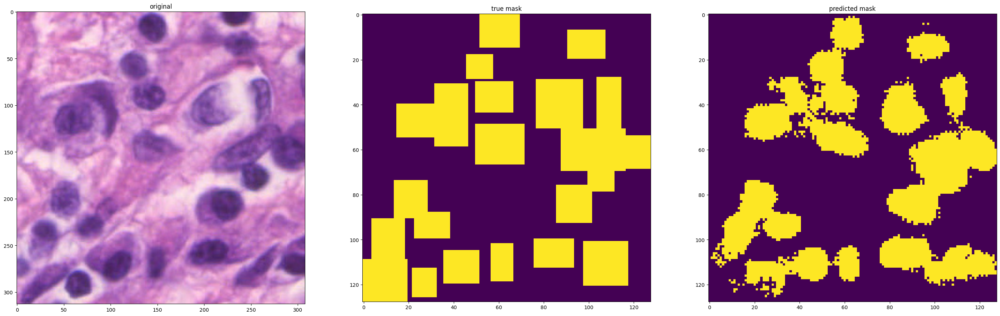

In [ ]:
plt.figure(figsize=(35,35))
plt.subplot(131), plt.title('original'), plt.imshow(bonus_test_images[0])
plt.subplot(132), plt.title('true mask'), plt.imshow(bonus_Y_test[0])
plt.subplot(133), plt.title('predicted mask'), plt.imshow(bonus_pred_test[0])
plt.show()